# DCGAN

Original paper: [Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks](https://arxiv.org/abs/1511.06434)

In [ ]:
import os
import matplotlib.pyplot as plt
import torch
import torchvision
import numpy as np
from torch import nn

In [ ]:
image_size = 64
transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(image_size),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5,),(0.5,))
    ])

train_data = torchvision.datasets.MNIST(root="data/mnist", train=True, download=True, transform=transform)

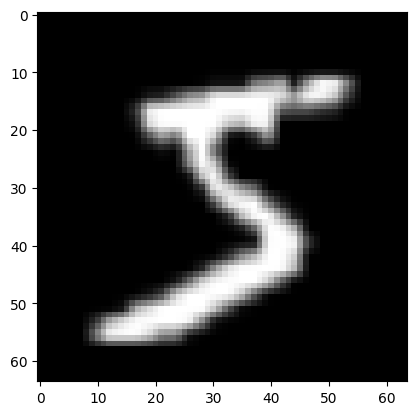

In [ ]:
plt.imshow(train_data[0][0][0], cmap="gray")

In [ ]:
train_batch_size = 128
num_workers = 2
train_dataloader = torch.utils.data.DataLoader(dataset=train_data, batch_size=train_batch_size, num_workers=num_workers, shuffle=True)

In [ ]:
def show_batch(batch, figsize=(10,8), num_images=None, save_name=None):
  images, labels = batch
  num_images = num_images if num_images is not None else len(images)
  nrows = int(np.sqrt(num_images))
  ncols = int(np.ceil(num_images / nrows))
  fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
  axes = axes.ravel()
  for ax in axes: ax.axis("off")
  for i in range(num_images):
    axes[i].imshow(images[i][0], cmap="gray")
    # axes[i].set_title(f"{labels[i]}")
  if save_name is not None: plt.savefig(save_name)
  plt.show()

torch.Size([128, 1, 64, 64])


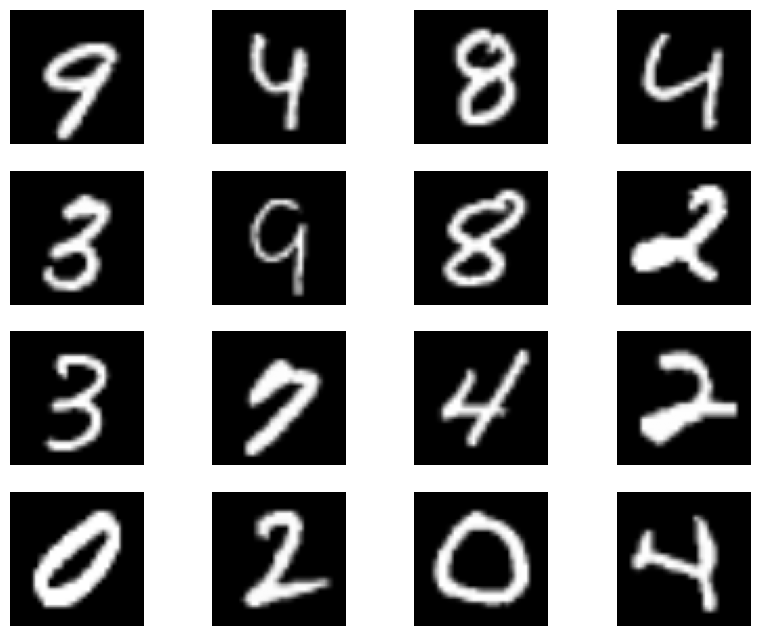

In [ ]:
for batch in train_dataloader:
  print(batch[0].shape)
  show_batch(batch, num_images=16,)
  break

In [ ]:
class GeneratorBlock(nn.Sequential):
  def __init__(self, in_channels: int, out_channels: int, kernel_size: int, stride: int, padding: int, act: nn.Module = nn.ReLU()):
    super(GeneratorBlock, self).__init__()
    self.conv2d_trans = nn.ConvTranspose2d(
        in_channels=in_channels, out_channels=out_channels,
        kernel_size=kernel_size, padding=padding, stride=stride
    )
    self.batch_norm = nn.BatchNorm2d(out_channels)
    self.act = act

In [ ]:
block = GeneratorBlock(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1)
batch_in = torch.normal(0,1,(train_batch_size,512,8,8))
batch_out = block(batch_in)
print("In shape:", batch_in.shape)
print("Out shape:", batch_out.shape)
block

In shape: torch.Size([128, 512, 8, 8])
Out shape: torch.Size([128, 256, 16, 16])


GeneratorBlock(
  (conv2d_trans): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (batch_norm): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act): ReLU()
)

In [ ]:
class Generator(nn.Sequential):
  def __init__(self, init_channels: int = 1024, latent_dim: int = 100, img_channels: int = 3):
    super(Generator, self).__init__()
    self.append(
        GeneratorBlock(in_channels=latent_dim, out_channels=init_channels, stride=1, kernel_size=4, padding=0)
    ) # output shape: (init_channels, 4, 4)
    self.append(
        GeneratorBlock(in_channels=init_channels, out_channels=init_channels//2, stride=2, kernel_size=4, padding=1)
    ) # output shape: (init_channels//2, 8, 8)
    self.append(
        GeneratorBlock(in_channels=init_channels//2, out_channels=init_channels//4, stride=2, kernel_size=4, padding=1)
    ) # output shape: (init_channels//4, 16, 16)
    self.append(
        GeneratorBlock(in_channels=init_channels//4, out_channels=init_channels//8, stride=2, kernel_size=4, padding=1)
    ) # output shape: (init_channels//8, 32, 32)
    self.append(
        GeneratorBlock(in_channels=init_channels//8, out_channels=img_channels, stride=2, kernel_size=4, padding=1, act=nn.Tanh())
    ) # output shape: (init_channels//16, 64, 64)

init_channels = 64
latent_dim = 100

generator = Generator(init_channels=1024, latent_dim=latent_dim)
batch_in = torch.normal(0,1,(train_batch_size,latent_dim,1,1))
batch_out = generator(batch_in)
print("In shape:", batch_in.shape)
print("Out shape:", batch_out.shape)
generator

In shape: torch.Size([128, 100, 1, 1])
Out shape: torch.Size([128, 3, 64, 64])


Generator(
  (0): GeneratorBlock(
    (conv2d_trans): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1))
    (batch_norm): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): ReLU()
  )
  (1): GeneratorBlock(
    (conv2d_trans): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (batch_norm): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): ReLU()
  )
  (2): GeneratorBlock(
    (conv2d_trans): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (batch_norm): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): ReLU()
  )
  (3): GeneratorBlock(
    (conv2d_trans): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (batch_norm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): ReLU()
  )
  (4): GeneratorBlock(
    (conv2d_tra

In [ ]:
class DiscriminatorBlock(nn.Sequential):
  def __init__(self, in_channels: int, out_channels: int, kernel_size: int, stride: int, padding: int, alpha: float = 0.2):
    super(DiscriminatorBlock, self).__init__()
    self.conv2d = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
    self.batch_norm = nn.BatchNorm2d(out_channels)
    self.leaky_relu = nn.LeakyReLU(alpha)

block = DiscriminatorBlock(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1)
batch_in = torch.normal(0, 1, (train_batch_size, 3, 64, 64))
batch_out = block(batch_in)
print("In shape:", batch_in.shape)
print("Out shape:", batch_out.shape)

In shape: torch.Size([128, 3, 64, 64])
Out shape: torch.Size([128, 64, 32, 32])


In [ ]:
class Discriminator(nn.Sequential):
  def __init__(self, init_channels: int = 64, img_channels: int = 3):
    super(Discriminator, self).__init__()
    self.append(
        DiscriminatorBlock(in_channels=img_channels, out_channels=init_channels, kernel_size=4, stride=2, padding=1)
    ) # output shape: (init_channels, 32, 32)
    self.append(
        DiscriminatorBlock(in_channels=init_channels, out_channels=init_channels*2, kernel_size=4, stride=2, padding=1)
    ) # output shape: (init_channels*2, 16, 16)
    self.append(
        DiscriminatorBlock(in_channels=init_channels*2, out_channels=init_channels*4, kernel_size=4, stride=2, padding=1)
    ) # output shape: (init_channels*4, 8, 8)
    self.append(
        DiscriminatorBlock(in_channels=init_channels*4, out_channels=init_channels*8, kernel_size=4, stride=2, padding=1)
    ) # output shape: (init_channels*8, 4, 4)
    self.append(
        nn.Conv2d(in_channels=init_channels*8, out_channels=1, kernel_size=4, stride=2, padding=0)
    ) # output shape: (1, 1, 1)
discriminator = Discriminator(init_channels=64)
batch_in = torch.normal(0, 1, (train_batch_size, 3, 64, 64))
batch_out = discriminator(batch_in)
print("In shape:", batch_in.shape)
print("Out shape:", batch_out.shape)
discriminator

In shape: torch.Size([128, 3, 64, 64])
Out shape: torch.Size([128, 1, 1, 1])


Discriminator(
  (0): DiscriminatorBlock(
    (conv2d): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (batch_norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (leaky_relu): LeakyReLU(negative_slope=0.2)
  )
  (1): DiscriminatorBlock(
    (conv2d): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (batch_norm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (leaky_relu): LeakyReLU(negative_slope=0.2)
  )
  (2): DiscriminatorBlock(
    (conv2d): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (batch_norm): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (leaky_relu): LeakyReLU(negative_slope=0.2)
  )
  (3): DiscriminatorBlock(
    (conv2d): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (batch_norm): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
def update_discriminator(x, z, D, G, criterion, trainer_D):
  batch_size = x.shape[0]
  ones = torch.ones((batch_size,), device=x.device)
  zeros = torch.zeros((batch_size,), device=x.device)

  trainer_D.zero_grad()

  real_y = D(x)
  fake_y = D(G(z))
  loss_D = (criterion(real_y, ones.reshape(real_y.shape)) +
            criterion(fake_y, zeros.reshape(fake_y.shape))) / 2
  loss_D.backward()
  trainer_D.step()
  return loss_D.item()

def update_generator(z, D, G, criterion, trainer_G):
  batch_size = z.shape[0]
  ones = torch.ones((batch_size,), device=z.device)

  trainer_G.zero_grad()

  fake_y = D(G(z))
  loss_G = criterion(fake_y, ones.reshape(fake_y.shape))
  loss_G.backward()
  trainer_G.step()
  return loss_G.item()

In [ ]:
def train_dcgan(D, G, lr_D, lr_G, latent_dim, dataloader, num_epochs, device, fixed_noise, visualize=True, print_every=50):
  print(f"Device: {device}")
  criterion = nn.BCEWithLogitsLoss(reduction="sum")

  for w in D.parameters(): torch.nn.init.normal_(w, 0., 0.02)
  for w in G.parameters(): torch.nn.init.normal_(w, 0., 0.02)

  trainer_D = torch.optim.Adam(D.parameters(), lr_D, betas=(0.5, 0.999))
  trainer_G = torch.optim.Adam(G.parameters(), lr_G, betas=(0.5, 0.999))

  metrics = []

  for epoch in range(num_epochs):
    loss_D = 0.
    loss_G = 0.
    num_instances = 0
    for step_num, (x,l) in enumerate(dataloader):
      x = x.to(device)
      batch_size = x.shape[0]
      num_instances += batch_size
      z = torch.normal(0., 1., size=(batch_size, latent_dim, 1, 1), device=x.device)

      loss_D += update_discriminator(x=x, z=z, D=D, G=G, criterion=criterion, trainer_D=trainer_D)
      loss_G += update_generator(z=z, D=D, G=G, criterion=criterion, trainer_G=trainer_G)
      if step_num % print_every==0:
        print(f"[Epoch {epoch}/{num_epochs}] [Step {step_num}/{len(dataloader)}] loss_D: {loss_D/num_instances:.4f}, loss_G: {loss_G/num_instances:.4f}")


    loss_D /= num_instances
    loss_G /= num_instances
    metrics.append([loss_D, loss_G])
    print(f"[Epoch {epoch}/{num_epochs}] loss_D: {loss_D:.4f}, loss_G: {loss_G:.4f}")

    if visualize:
      print("Generated images:")
      os.makedirs("visualizations", exist_ok=True)
      # z = torch.normal(0., 1., size=(16, latent_dim, 1, 1), device=x.device)
      fake_data = G(fixed_noise.to(device)).detach().cpu()
      show_batch((fake_data,None), save_name=f"visualizations/generated-{epoch:02d}.png")
  metrics = np.array(metrics)
  plt.plot(metrics[:, 0], label="loss_D")
  plt.plot(metrics[:, 1], label="loss_G")
  plt.legend()
  plt.show()

Device: cuda
[Epoch 0/50] [Step 0/469] loss_D: 0.6890, loss_G: 0.7738
[Epoch 0/50] [Step 100/469] loss_D: 0.1467, loss_G: 2.7446
[Epoch 0/50] [Step 200/469] loss_D: 0.0770, loss_G: 3.9064
[Epoch 0/50] [Step 300/469] loss_D: 0.0521, loss_G: 4.6592
[Epoch 0/50] [Step 400/469] loss_D: 0.0394, loss_G: 5.2154
[Epoch 0/50] loss_D: 0.0338, loss_G: 5.5246
Generated images:


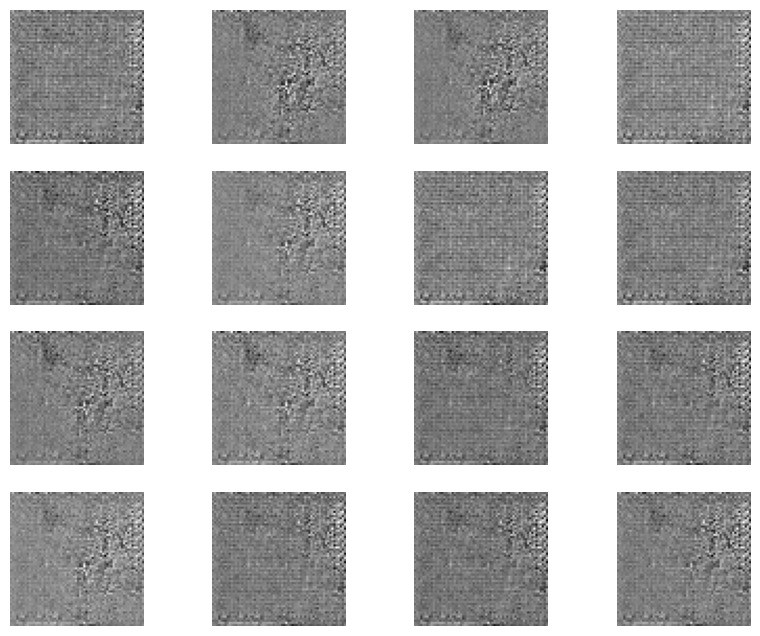

[Epoch 1/50] [Step 0/469] loss_D: 0.0005, loss_G: 7.4878
[Epoch 1/50] [Step 100/469] loss_D: 0.0004, loss_G: 7.7154
[Epoch 1/50] [Step 200/469] loss_D: 0.0004, loss_G: 7.9132
[Epoch 1/50] [Step 300/469] loss_D: 0.0003, loss_G: 8.0833
[Epoch 1/50] [Step 400/469] loss_D: 0.0003, loss_G: 8.2307
[Epoch 1/50] loss_D: 0.0003, loss_G: 8.3277
Generated images:


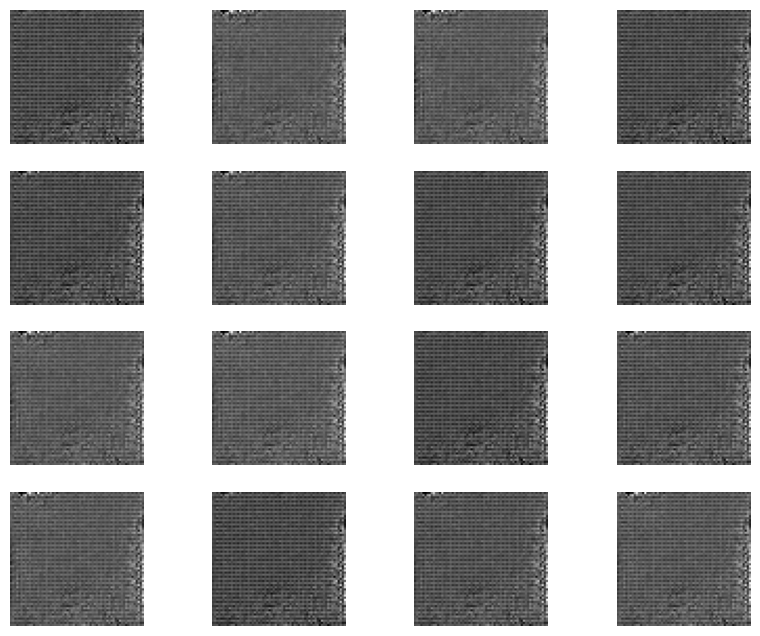

[Epoch 2/50] [Step 0/469] loss_D: 0.0001, loss_G: 8.8238
[Epoch 2/50] [Step 100/469] loss_D: 0.0001, loss_G: 9.0730
[Epoch 2/50] [Step 200/469] loss_D: 0.0001, loss_G: 9.1792
[Epoch 2/50] [Step 300/469] loss_D: 0.0001, loss_G: 9.2771
[Epoch 2/50] [Step 400/469] loss_D: 0.0001, loss_G: 9.3931
[Epoch 2/50] loss_D: 0.0001, loss_G: 9.4378
Generated images:


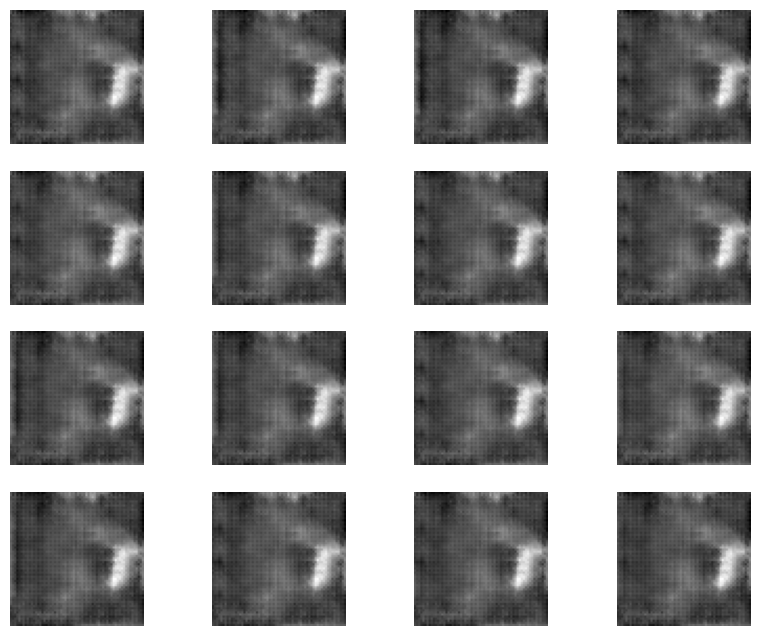

[Epoch 3/50] [Step 0/469] loss_D: 0.0000, loss_G: 9.9098
[Epoch 3/50] [Step 100/469] loss_D: 0.0000, loss_G: 9.9487
[Epoch 3/50] [Step 200/469] loss_D: 0.0000, loss_G: 10.0266
[Epoch 3/50] [Step 300/469] loss_D: 0.0000, loss_G: 10.1145
[Epoch 3/50] [Step 400/469] loss_D: 0.0000, loss_G: 10.1674
[Epoch 3/50] loss_D: 0.0000, loss_G: 10.2139
Generated images:


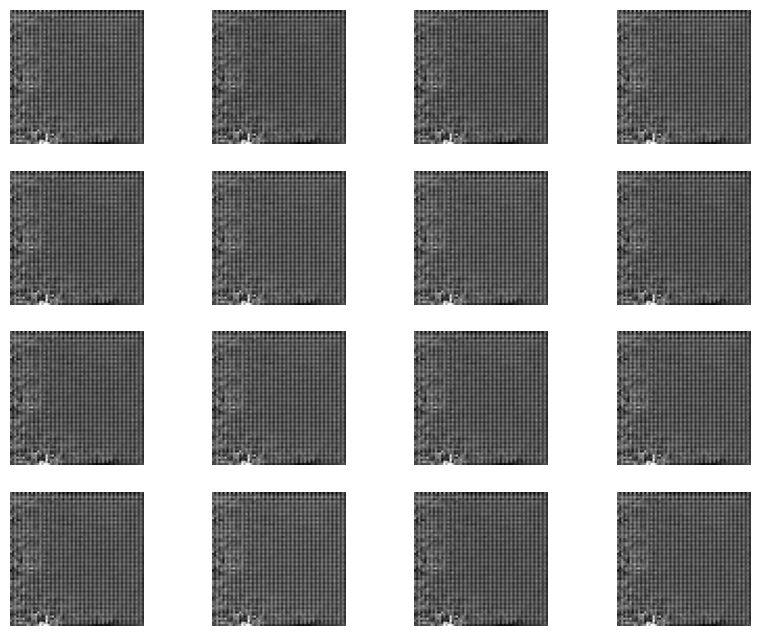

[Epoch 4/50] [Step 0/469] loss_D: 0.0000, loss_G: 10.5124
[Epoch 4/50] [Step 100/469] loss_D: 0.0000, loss_G: 10.6168
[Epoch 4/50] [Step 200/469] loss_D: 0.0000, loss_G: 10.6447
[Epoch 4/50] [Step 300/469] loss_D: 0.0000, loss_G: 10.6901
[Epoch 4/50] [Step 400/469] loss_D: 0.0000, loss_G: 10.7643
[Epoch 4/50] loss_D: 0.0000, loss_G: 10.8075
Generated images:


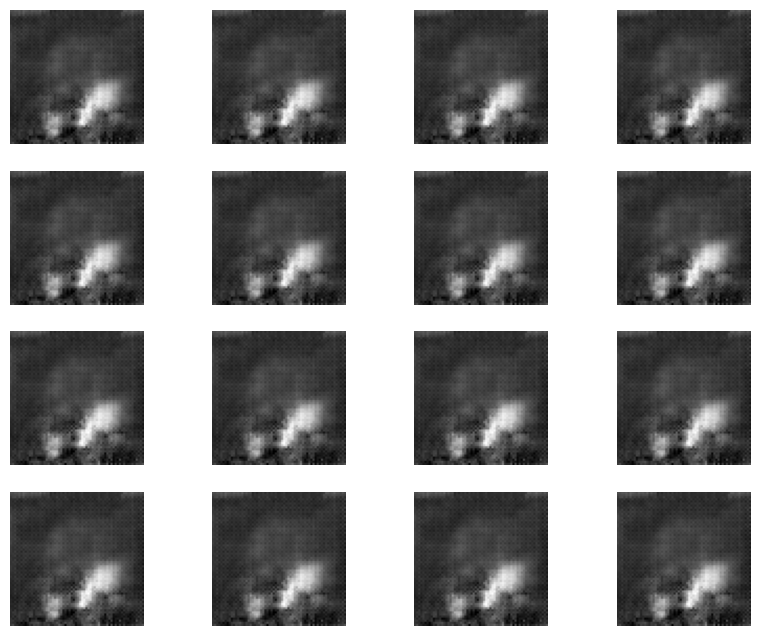

[Epoch 5/50] [Step 0/469] loss_D: 0.0000, loss_G: 11.0893
[Epoch 5/50] [Step 100/469] loss_D: 0.0000, loss_G: 11.1734
[Epoch 5/50] [Step 200/469] loss_D: 0.0000, loss_G: 11.2137
[Epoch 5/50] [Step 300/469] loss_D: 0.0000, loss_G: 11.2599
[Epoch 5/50] [Step 400/469] loss_D: 0.0000, loss_G: 11.3071
[Epoch 5/50] loss_D: 0.0000, loss_G: 11.3358
Generated images:


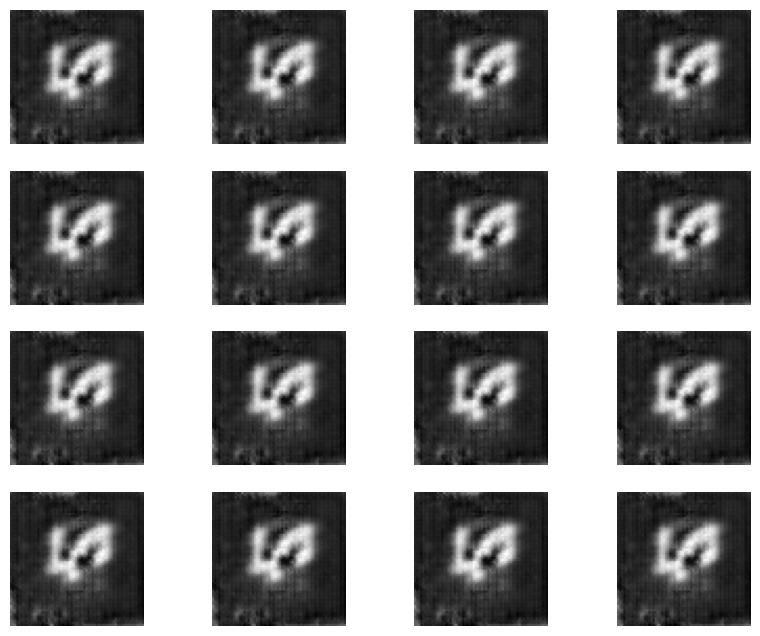

[Epoch 6/50] [Step 0/469] loss_D: 0.0000, loss_G: 11.5693
[Epoch 6/50] [Step 100/469] loss_D: 0.0000, loss_G: 11.4687
[Epoch 6/50] [Step 200/469] loss_D: 0.0000, loss_G: 11.5007
[Epoch 6/50] [Step 300/469] loss_D: 0.2281, loss_G: 8.2533
[Epoch 6/50] [Step 400/469] loss_D: 0.3250, loss_G: 6.5052
[Epoch 6/50] loss_D: 0.3676, loss_G: 5.7123
Generated images:


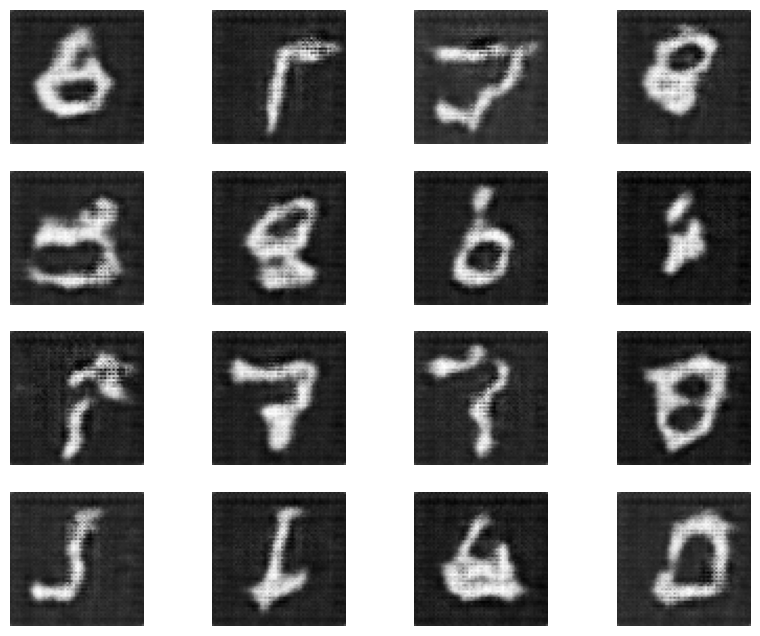

[Epoch 7/50] [Step 0/469] loss_D: 0.6330, loss_G: 0.9435
[Epoch 7/50] [Step 100/469] loss_D: 0.6127, loss_G: 0.9978
[Epoch 7/50] [Step 200/469] loss_D: 0.5977, loss_G: 1.0506
[Epoch 7/50] [Step 300/469] loss_D: 0.5876, loss_G: 1.0894
[Epoch 7/50] [Step 400/469] loss_D: 0.5813, loss_G: 1.1046
[Epoch 7/50] loss_D: 0.5780, loss_G: 1.1174
Generated images:


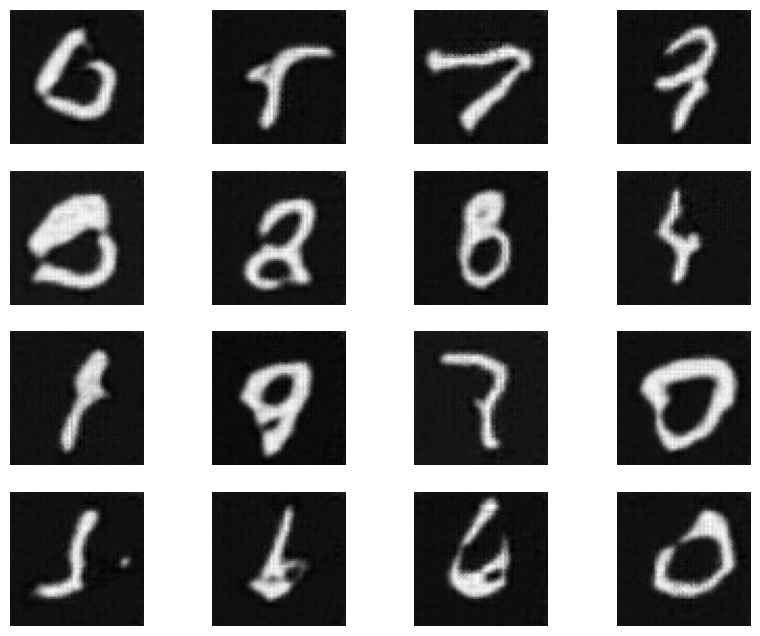

[Epoch 8/50] [Step 0/469] loss_D: 0.5681, loss_G: 0.3278
[Epoch 8/50] [Step 100/469] loss_D: 0.5604, loss_G: 1.1997
[Epoch 8/50] [Step 200/469] loss_D: 0.5564, loss_G: 1.2318
[Epoch 8/50] [Step 300/469] loss_D: 0.5531, loss_G: 1.2529
[Epoch 8/50] [Step 400/469] loss_D: 0.5434, loss_G: 1.2933
[Epoch 8/50] loss_D: 0.5364, loss_G: 1.3269
Generated images:


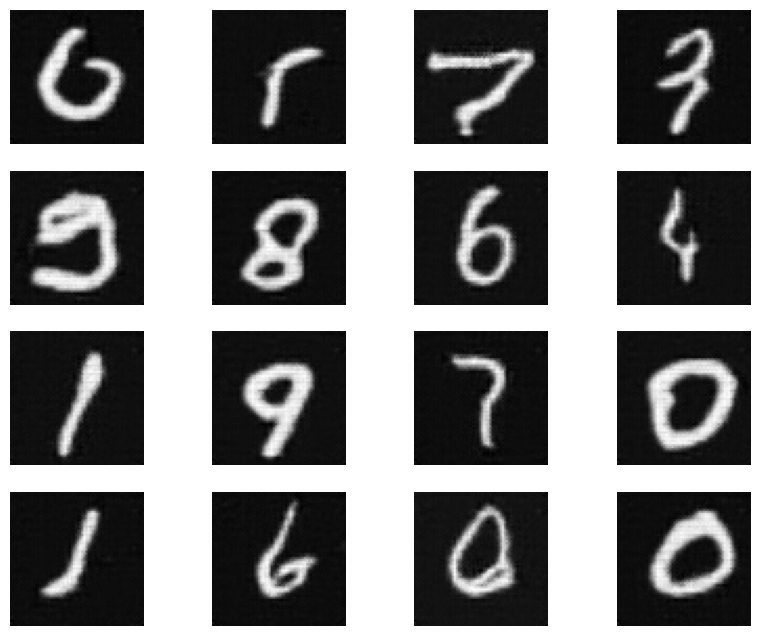

[Epoch 9/50] [Step 0/469] loss_D: 0.4559, loss_G: 0.4255
[Epoch 9/50] [Step 100/469] loss_D: 0.5065, loss_G: 1.5020
[Epoch 9/50] [Step 200/469] loss_D: 0.4972, loss_G: 1.5179
[Epoch 9/50] [Step 300/469] loss_D: 0.4970, loss_G: 1.5370
[Epoch 9/50] [Step 400/469] loss_D: 0.4926, loss_G: 1.5483
[Epoch 9/50] loss_D: 0.4914, loss_G: 1.5495
Generated images:


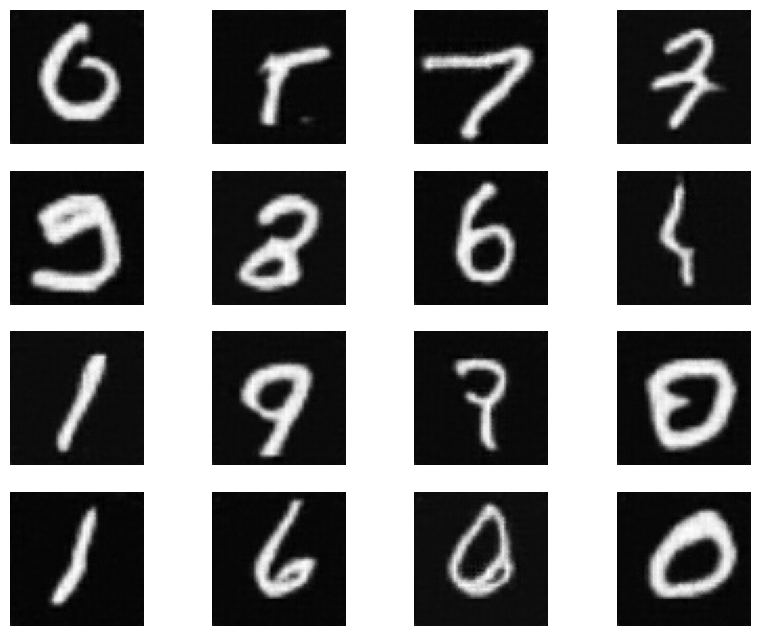

[Epoch 10/50] [Step 0/469] loss_D: 0.2977, loss_G: 1.8452
[Epoch 10/50] [Step 100/469] loss_D: 0.4591, loss_G: 1.6026
[Epoch 10/50] [Step 200/469] loss_D: 0.4739, loss_G: 1.6083
[Epoch 10/50] [Step 300/469] loss_D: 0.4720, loss_G: 1.6093
[Epoch 10/50] [Step 400/469] loss_D: 0.4720, loss_G: 1.6031
[Epoch 10/50] loss_D: 0.4722, loss_G: 1.6013
Generated images:


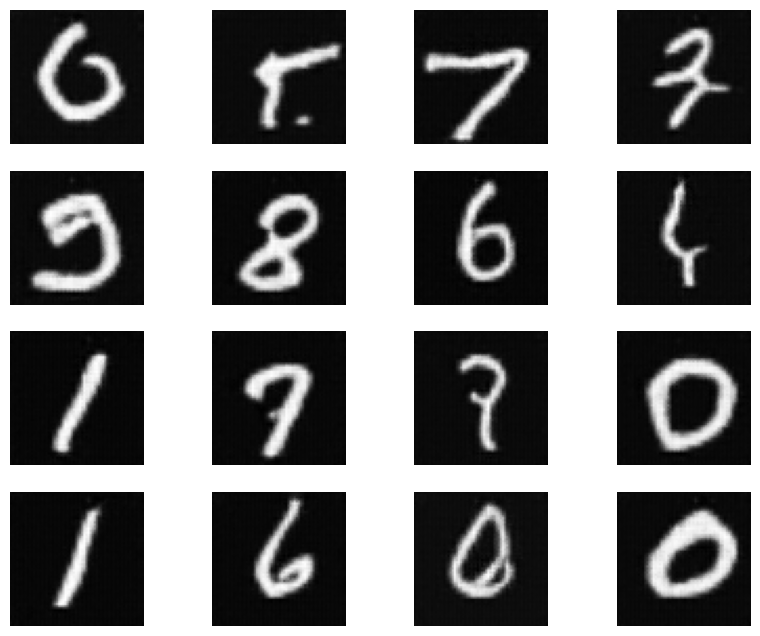

[Epoch 11/50] [Step 0/469] loss_D: 0.2727, loss_G: 1.5460
[Epoch 11/50] [Step 100/469] loss_D: 0.4864, loss_G: 1.6013
[Epoch 11/50] [Step 200/469] loss_D: 0.4868, loss_G: 1.5791
[Epoch 11/50] [Step 300/469] loss_D: 0.4852, loss_G: 1.5948
[Epoch 11/50] [Step 400/469] loss_D: 0.4867, loss_G: 1.5871
[Epoch 11/50] loss_D: 0.4841, loss_G: 1.5870
Generated images:


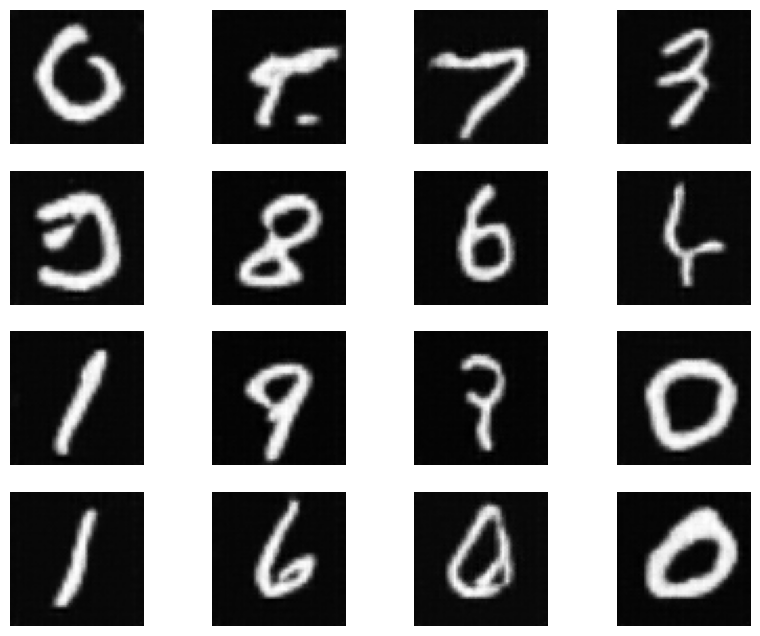

[Epoch 12/50] [Step 0/469] loss_D: 0.5592, loss_G: 0.2720
[Epoch 12/50] [Step 100/469] loss_D: 0.4956, loss_G: 1.5800
[Epoch 12/50] [Step 200/469] loss_D: 0.4786, loss_G: 1.6016
[Epoch 12/50] [Step 300/469] loss_D: 0.4845, loss_G: 1.5994
[Epoch 12/50] [Step 400/469] loss_D: 0.4873, loss_G: 1.5969
[Epoch 12/50] loss_D: 0.4829, loss_G: 1.5956
Generated images:


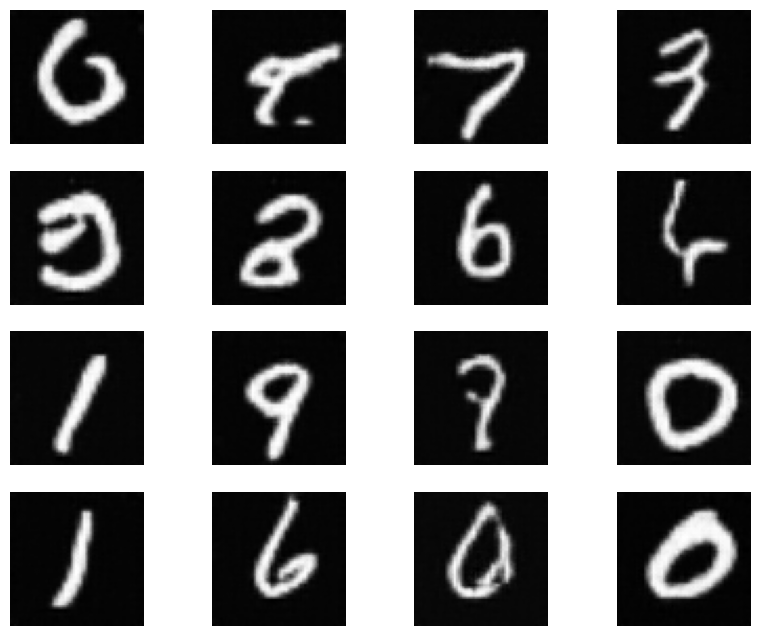

[Epoch 13/50] [Step 0/469] loss_D: 0.3828, loss_G: 1.1132
[Epoch 13/50] [Step 100/469] loss_D: 0.4839, loss_G: 1.6161
[Epoch 13/50] [Step 200/469] loss_D: 0.4714, loss_G: 1.6133
[Epoch 13/50] [Step 300/469] loss_D: 0.4680, loss_G: 1.6119
[Epoch 13/50] [Step 400/469] loss_D: 0.4754, loss_G: 1.6102
[Epoch 13/50] loss_D: 0.4770, loss_G: 1.6147
Generated images:


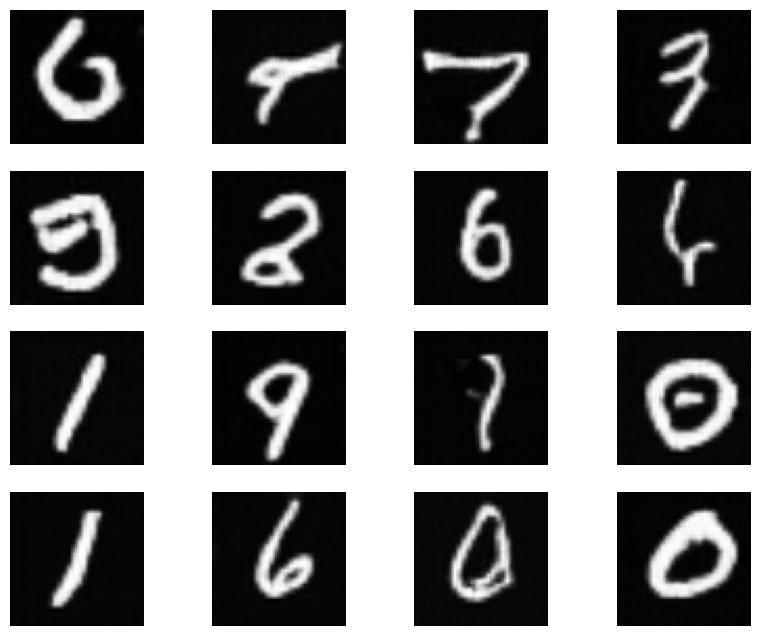

[Epoch 14/50] [Step 0/469] loss_D: 0.4633, loss_G: 0.6825
[Epoch 14/50] [Step 100/469] loss_D: 0.5022, loss_G: 1.5062
[Epoch 14/50] [Step 200/469] loss_D: 0.5023, loss_G: 1.4846
[Epoch 14/50] [Step 300/469] loss_D: 0.4965, loss_G: 1.4911
[Epoch 14/50] [Step 400/469] loss_D: 0.4981, loss_G: 1.5008
[Epoch 14/50] loss_D: 0.4939, loss_G: 1.5012
Generated images:


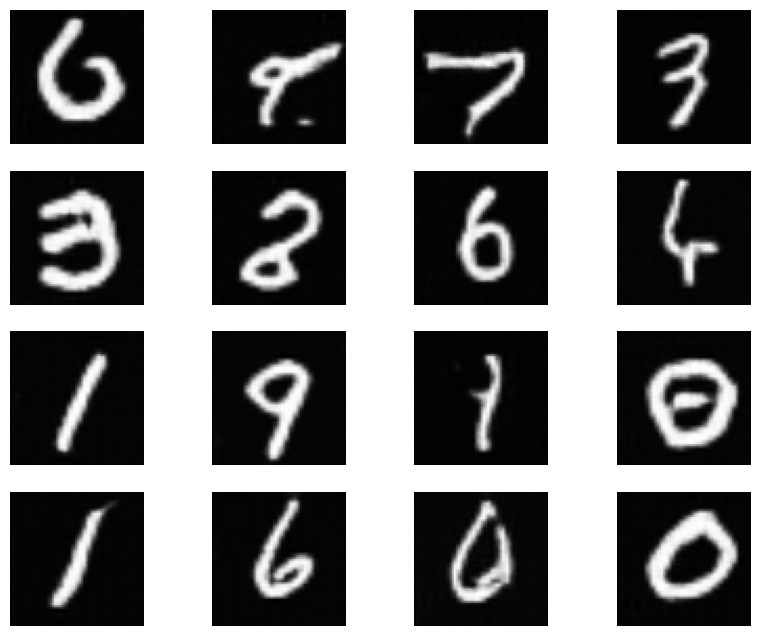

[Epoch 15/50] [Step 0/469] loss_D: 0.3041, loss_G: 1.1058
[Epoch 15/50] [Step 100/469] loss_D: 0.5088, loss_G: 1.4894
[Epoch 15/50] [Step 200/469] loss_D: 0.4948, loss_G: 1.5149
[Epoch 15/50] [Step 300/469] loss_D: 0.4938, loss_G: 1.5112
[Epoch 15/50] [Step 400/469] loss_D: 0.4941, loss_G: 1.5076
[Epoch 15/50] loss_D: 0.4930, loss_G: 1.5097
Generated images:


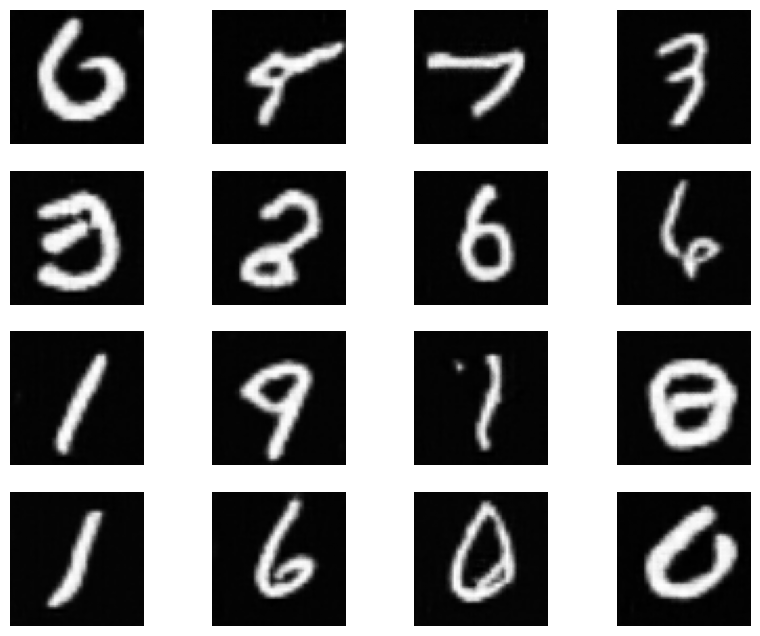

[Epoch 16/50] [Step 0/469] loss_D: 0.3536, loss_G: 1.4313
[Epoch 16/50] [Step 100/469] loss_D: 0.4808, loss_G: 1.5187
[Epoch 16/50] [Step 200/469] loss_D: 0.4882, loss_G: 1.5145
[Epoch 16/50] [Step 300/469] loss_D: 0.4874, loss_G: 1.5272
[Epoch 16/50] [Step 400/469] loss_D: 0.4896, loss_G: 1.5208
[Epoch 16/50] loss_D: 0.4903, loss_G: 1.5171
Generated images:


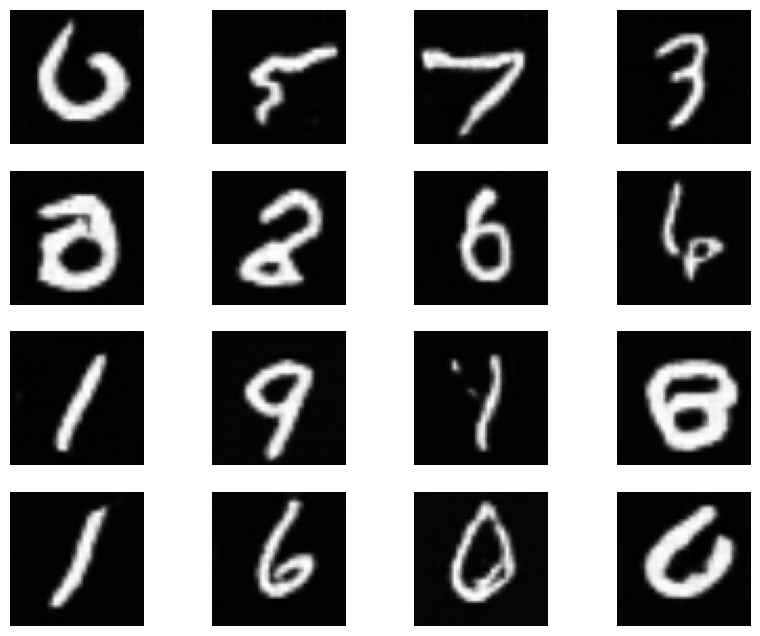

[Epoch 17/50] [Step 0/469] loss_D: 0.4002, loss_G: 1.9005
[Epoch 17/50] [Step 100/469] loss_D: 0.5085, loss_G: 1.4337
[Epoch 17/50] [Step 200/469] loss_D: 0.4898, loss_G: 1.4928
[Epoch 17/50] [Step 300/469] loss_D: 0.4903, loss_G: 1.4980
[Epoch 17/50] [Step 400/469] loss_D: 0.4922, loss_G: 1.4957
[Epoch 17/50] loss_D: 0.4901, loss_G: 1.5032
Generated images:


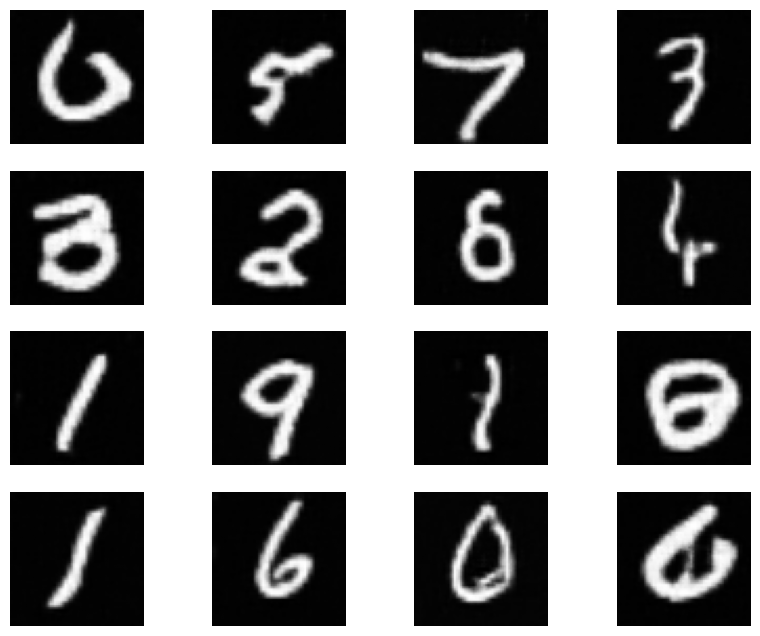

[Epoch 18/50] [Step 0/469] loss_D: 0.3252, loss_G: 1.8989
[Epoch 18/50] [Step 100/469] loss_D: 0.4674, loss_G: 1.5716
[Epoch 18/50] [Step 200/469] loss_D: 0.4740, loss_G: 1.5478
[Epoch 18/50] [Step 300/469] loss_D: 0.4749, loss_G: 1.5520
[Epoch 18/50] [Step 400/469] loss_D: 0.4746, loss_G: 1.5616
[Epoch 18/50] loss_D: 0.4719, loss_G: 1.5661
Generated images:


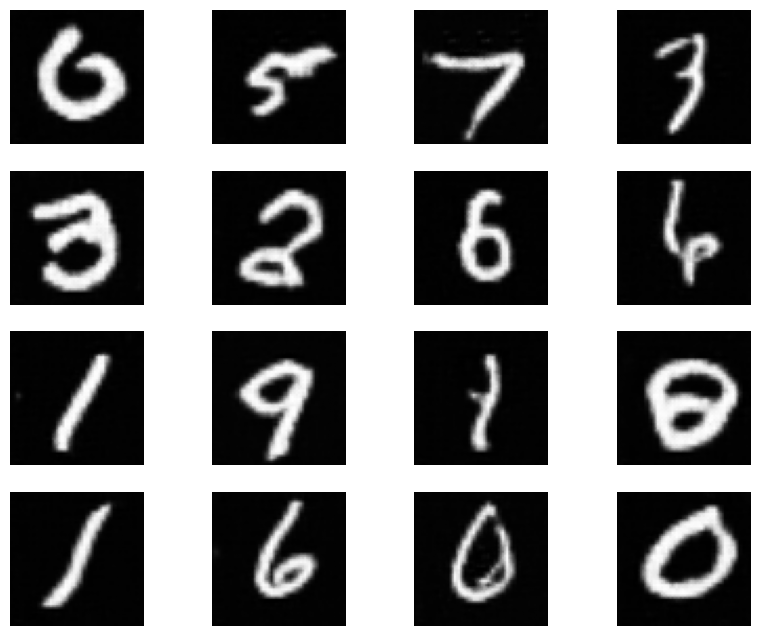

[Epoch 19/50] [Step 0/469] loss_D: 0.6244, loss_G: 3.5836
[Epoch 19/50] [Step 100/469] loss_D: 0.4662, loss_G: 1.6117
[Epoch 19/50] [Step 200/469] loss_D: 0.4558, loss_G: 1.6185
[Epoch 19/50] [Step 300/469] loss_D: 0.4529, loss_G: 1.6223
[Epoch 19/50] [Step 400/469] loss_D: 0.4608, loss_G: 1.6166
[Epoch 19/50] loss_D: 0.4610, loss_G: 1.6112
Generated images:


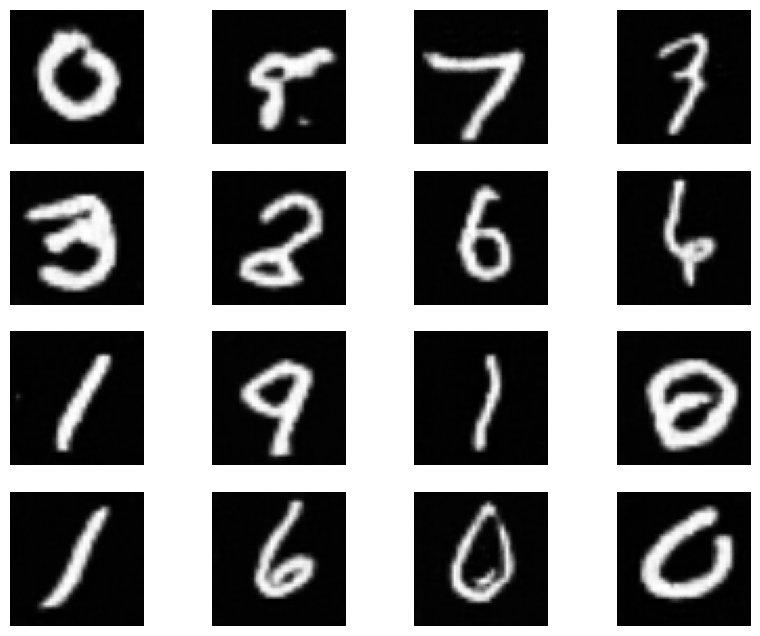

[Epoch 20/50] [Step 0/469] loss_D: 0.3614, loss_G: 0.7275
[Epoch 20/50] [Step 100/469] loss_D: 0.4587, loss_G: 1.6409
[Epoch 20/50] [Step 200/469] loss_D: 0.4459, loss_G: 1.6631
[Epoch 20/50] [Step 300/469] loss_D: 0.4389, loss_G: 1.6781
[Epoch 20/50] [Step 400/469] loss_D: 0.4485, loss_G: 1.6824
[Epoch 20/50] loss_D: 0.4482, loss_G: 1.6774
Generated images:


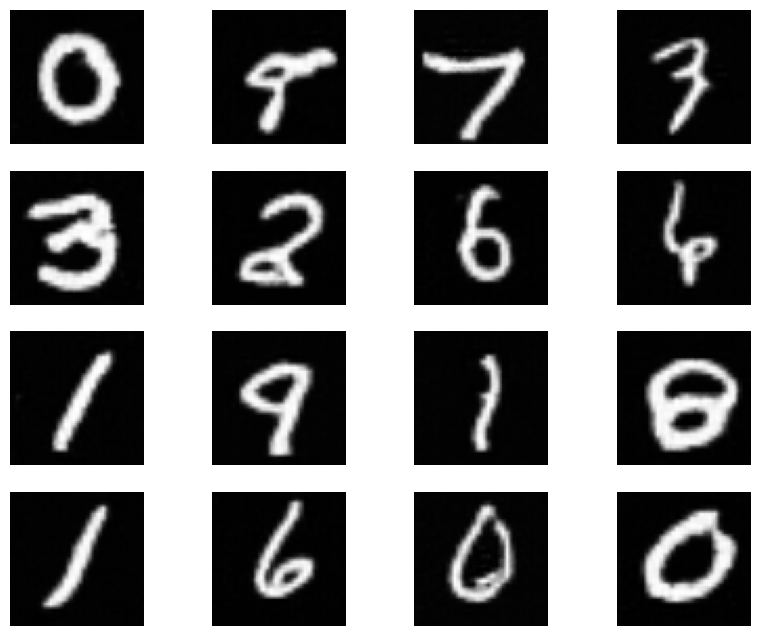

[Epoch 21/50] [Step 0/469] loss_D: 0.3281, loss_G: 1.9660
[Epoch 21/50] [Step 100/469] loss_D: 0.4113, loss_G: 1.7758
[Epoch 21/50] [Step 200/469] loss_D: 0.4122, loss_G: 1.7843
[Epoch 21/50] [Step 300/469] loss_D: 0.4268, loss_G: 1.7649
[Epoch 21/50] [Step 400/469] loss_D: 0.4248, loss_G: 1.7700
[Epoch 21/50] loss_D: 0.4249, loss_G: 1.7664
Generated images:


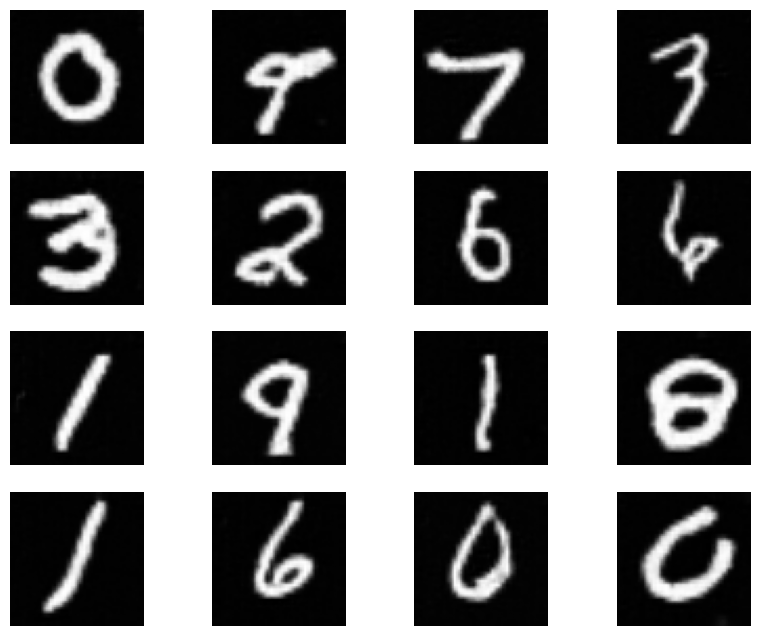

[Epoch 22/50] [Step 0/469] loss_D: 0.3167, loss_G: 2.8929
[Epoch 22/50] [Step 100/469] loss_D: 0.4092, loss_G: 1.8607
[Epoch 22/50] [Step 200/469] loss_D: 0.4202, loss_G: 1.8211
[Epoch 22/50] [Step 300/469] loss_D: 0.4180, loss_G: 1.8178
[Epoch 22/50] [Step 400/469] loss_D: 0.4235, loss_G: 1.8142
[Epoch 22/50] loss_D: 0.4143, loss_G: 1.8268
Generated images:


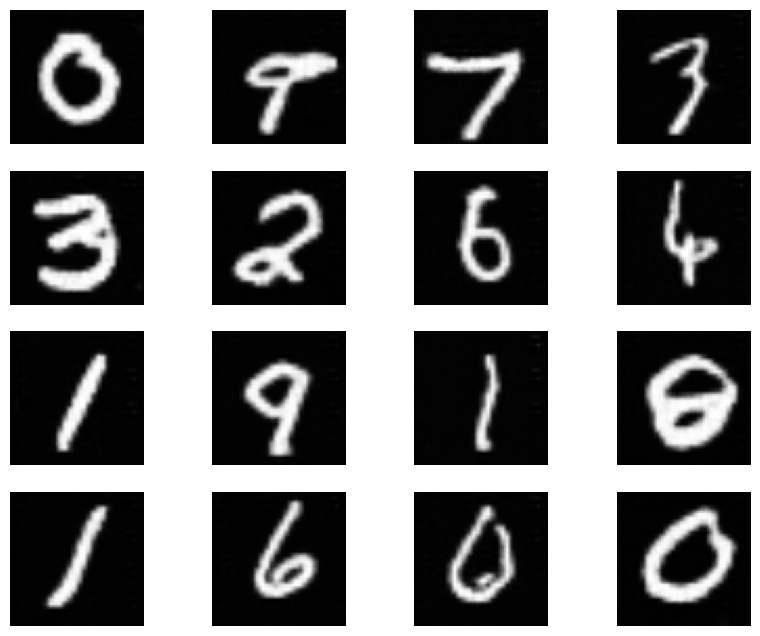

[Epoch 23/50] [Step 0/469] loss_D: 0.2196, loss_G: 2.3615
[Epoch 23/50] [Step 100/469] loss_D: 0.3706, loss_G: 1.9950
[Epoch 23/50] [Step 200/469] loss_D: 0.3881, loss_G: 1.9545
[Epoch 23/50] [Step 300/469] loss_D: 0.3927, loss_G: 1.9505
[Epoch 23/50] [Step 400/469] loss_D: 0.3940, loss_G: 1.9454
[Epoch 23/50] loss_D: 0.3927, loss_G: 1.9555
Generated images:


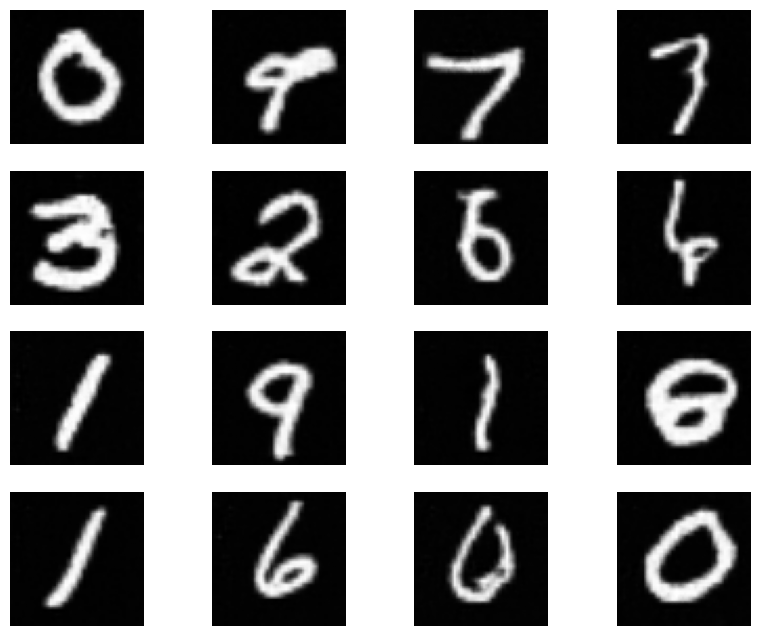

[Epoch 24/50] [Step 0/469] loss_D: 0.2340, loss_G: 2.9165
[Epoch 24/50] [Step 100/469] loss_D: 0.3705, loss_G: 2.0506
[Epoch 24/50] [Step 200/469] loss_D: 0.3740, loss_G: 2.0392
[Epoch 24/50] [Step 300/469] loss_D: 0.3766, loss_G: 2.0191
[Epoch 24/50] [Step 400/469] loss_D: 0.3744, loss_G: 2.0244
[Epoch 24/50] loss_D: 0.3820, loss_G: 2.0121
Generated images:


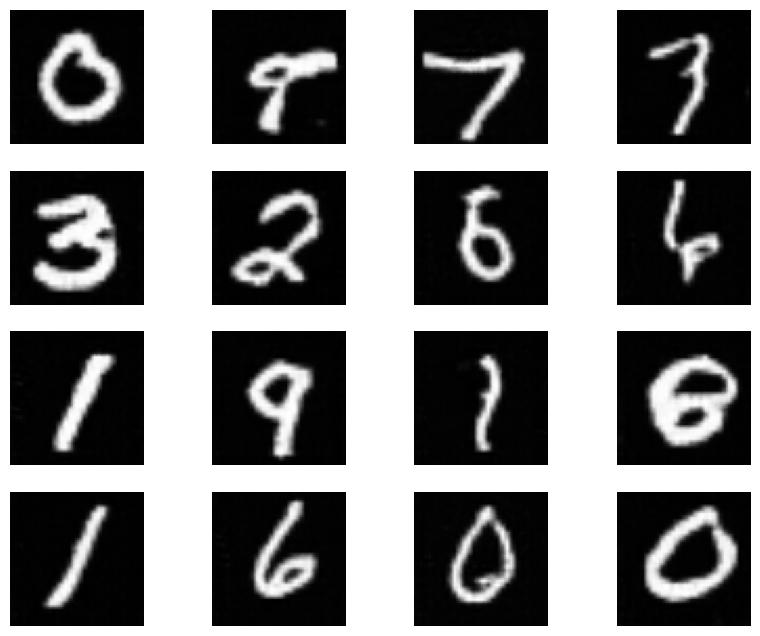

[Epoch 25/50] [Step 0/469] loss_D: 0.3014, loss_G: 1.6145
[Epoch 25/50] [Step 100/469] loss_D: 0.3822, loss_G: 2.0237
[Epoch 25/50] [Step 200/469] loss_D: 0.3724, loss_G: 2.0755
[Epoch 25/50] [Step 300/469] loss_D: 0.3572, loss_G: 2.1271
[Epoch 25/50] [Step 400/469] loss_D: 0.3510, loss_G: 2.1573
[Epoch 25/50] loss_D: 0.3488, loss_G: 2.1750
Generated images:


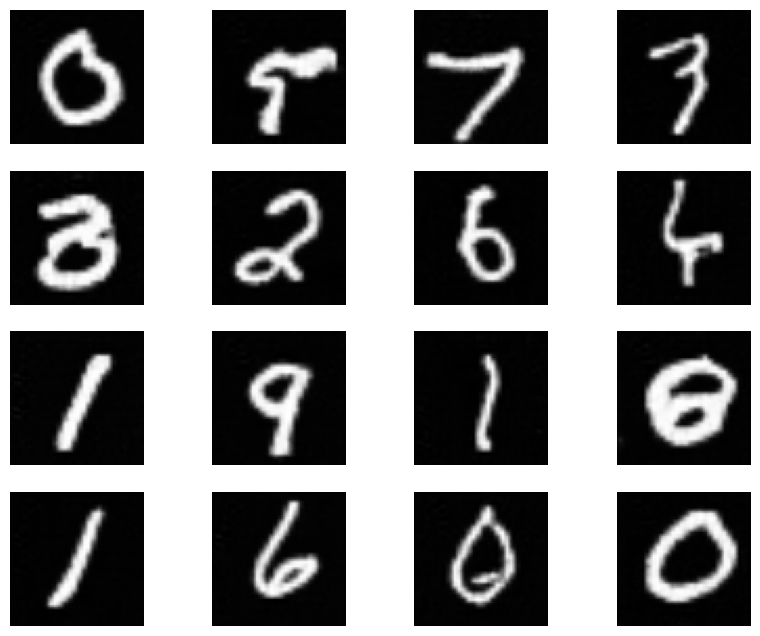

[Epoch 26/50] [Step 0/469] loss_D: 0.4217, loss_G: 0.9516
[Epoch 26/50] [Step 100/469] loss_D: 0.3173, loss_G: 2.2657
[Epoch 26/50] [Step 200/469] loss_D: 0.3595, loss_G: 2.1839
[Epoch 26/50] [Step 300/469] loss_D: 0.3440, loss_G: 2.2070
[Epoch 26/50] [Step 400/469] loss_D: 0.3378, loss_G: 2.2377
[Epoch 26/50] loss_D: 0.3355, loss_G: 2.2575
Generated images:


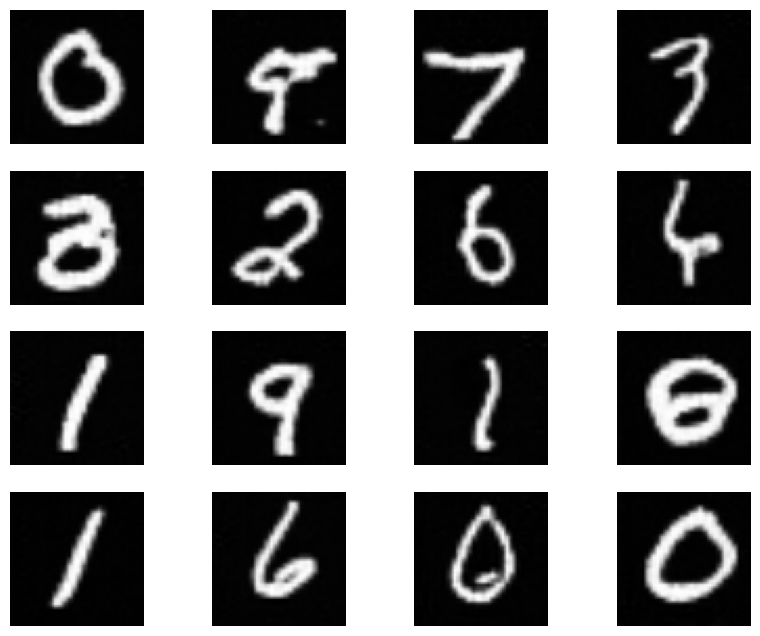

[Epoch 27/50] [Step 0/469] loss_D: 0.2079, loss_G: 2.9844
[Epoch 27/50] [Step 100/469] loss_D: 0.2650, loss_G: 2.4709
[Epoch 27/50] [Step 200/469] loss_D: 0.3406, loss_G: 2.2892
[Epoch 27/50] [Step 300/469] loss_D: 0.3368, loss_G: 2.2966
[Epoch 27/50] [Step 400/469] loss_D: 0.3471, loss_G: 2.2541
[Epoch 27/50] loss_D: 0.3333, loss_G: 2.2942
Generated images:


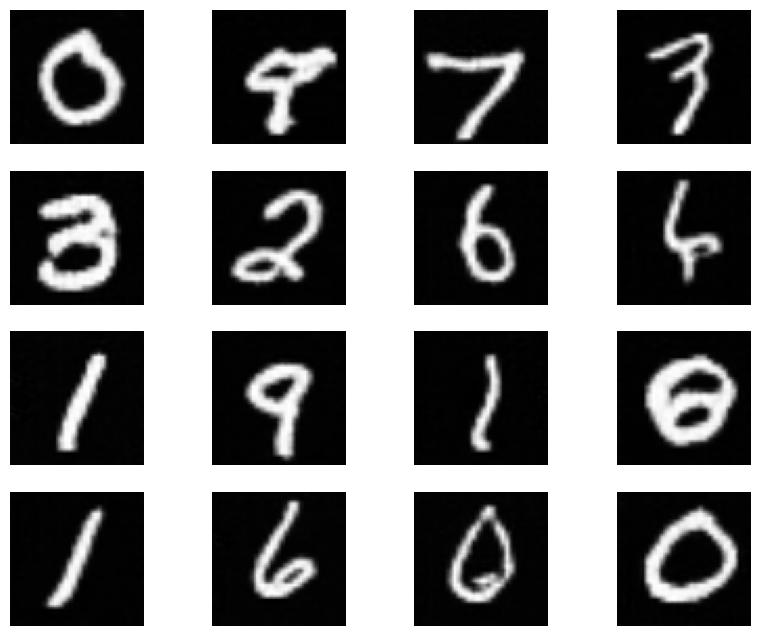

[Epoch 28/50] [Step 0/469] loss_D: 0.3263, loss_G: 1.0233
[Epoch 28/50] [Step 100/469] loss_D: 0.3126, loss_G: 2.3998
[Epoch 28/50] [Step 200/469] loss_D: 0.2901, loss_G: 2.4889
[Epoch 28/50] [Step 300/469] loss_D: 0.2848, loss_G: 2.5271
[Epoch 28/50] [Step 400/469] loss_D: 0.2874, loss_G: 2.5497
[Epoch 28/50] loss_D: 0.2990, loss_G: 2.5075
Generated images:


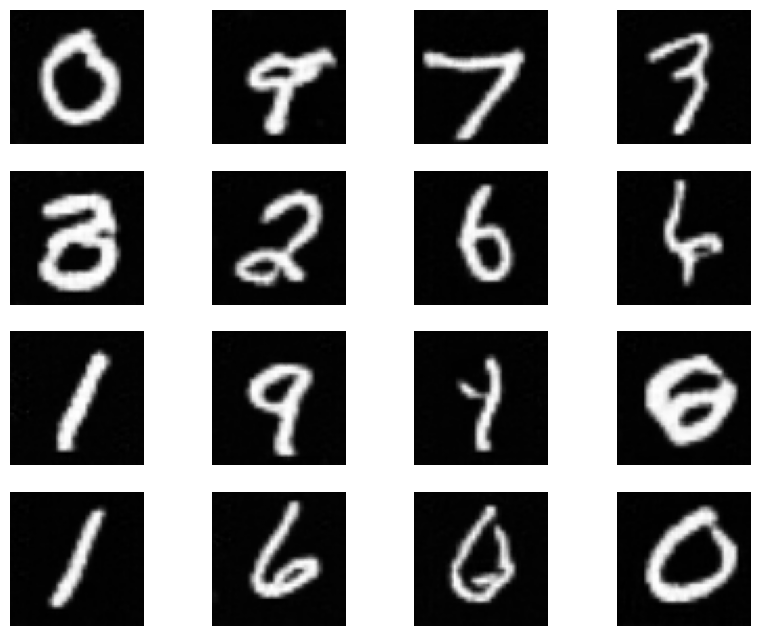

[Epoch 29/50] [Step 0/469] loss_D: 0.1297, loss_G: 2.7755
[Epoch 29/50] [Step 100/469] loss_D: 0.2365, loss_G: 2.6717
[Epoch 29/50] [Step 200/469] loss_D: 0.2729, loss_G: 2.6288
[Epoch 29/50] [Step 300/469] loss_D: 0.2639, loss_G: 2.6555
[Epoch 29/50] [Step 400/469] loss_D: 0.2799, loss_G: 2.6197
[Epoch 29/50] loss_D: 0.2754, loss_G: 2.6346
Generated images:


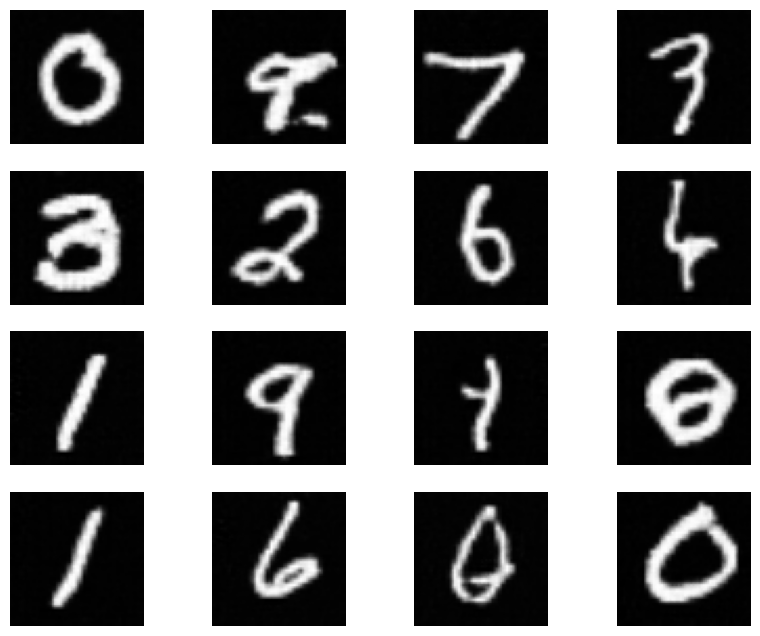

[Epoch 30/50] [Step 0/469] loss_D: 0.2401, loss_G: 1.7003
[Epoch 30/50] [Step 100/469] loss_D: 0.2994, loss_G: 2.5665
[Epoch 30/50] [Step 200/469] loss_D: 0.2716, loss_G: 2.6644
[Epoch 30/50] [Step 300/469] loss_D: 0.2891, loss_G: 2.6395
[Epoch 30/50] [Step 400/469] loss_D: 0.3002, loss_G: 2.5460
[Epoch 30/50] loss_D: 0.2920, loss_G: 2.5878
Generated images:


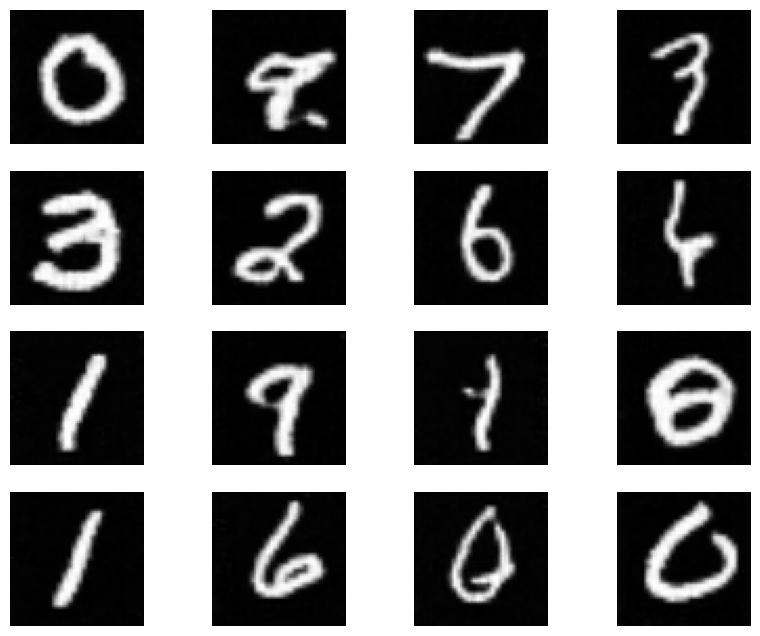

[Epoch 31/50] [Step 0/469] loss_D: 0.2432, loss_G: 1.7388
[Epoch 31/50] [Step 100/469] loss_D: 0.3142, loss_G: 2.5087
[Epoch 31/50] [Step 200/469] loss_D: 0.3294, loss_G: 2.4482
[Epoch 31/50] [Step 300/469] loss_D: 0.3139, loss_G: 2.4957
[Epoch 31/50] [Step 400/469] loss_D: 0.3141, loss_G: 2.4895
[Epoch 31/50] loss_D: 0.3062, loss_G: 2.5312
Generated images:


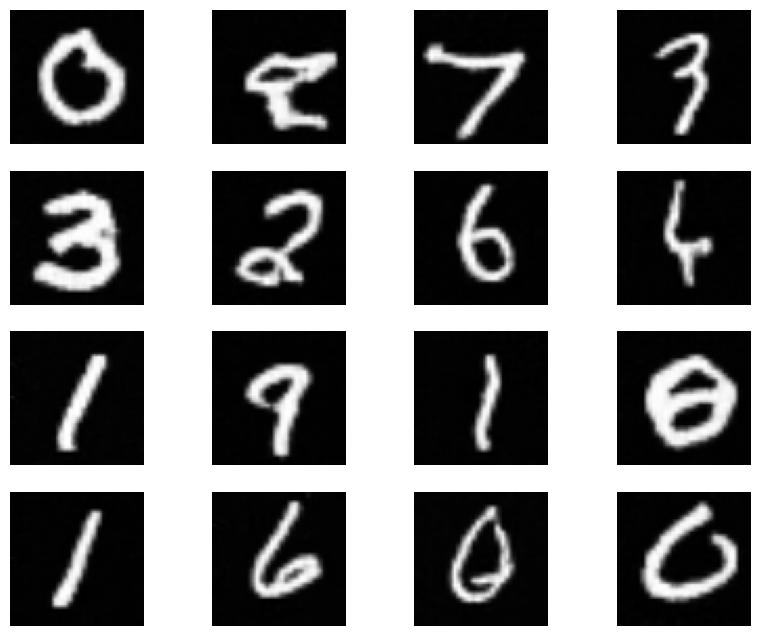

[Epoch 32/50] [Step 0/469] loss_D: 0.0772, loss_G: 2.6488
[Epoch 32/50] [Step 100/469] loss_D: 0.2584, loss_G: 2.6414
[Epoch 32/50] [Step 200/469] loss_D: 0.2914, loss_G: 2.6592
[Epoch 32/50] [Step 300/469] loss_D: 0.2559, loss_G: 2.7939
[Epoch 32/50] [Step 400/469] loss_D: 0.2515, loss_G: 2.8266
[Epoch 32/50] loss_D: 0.2673, loss_G: 2.7425
Generated images:


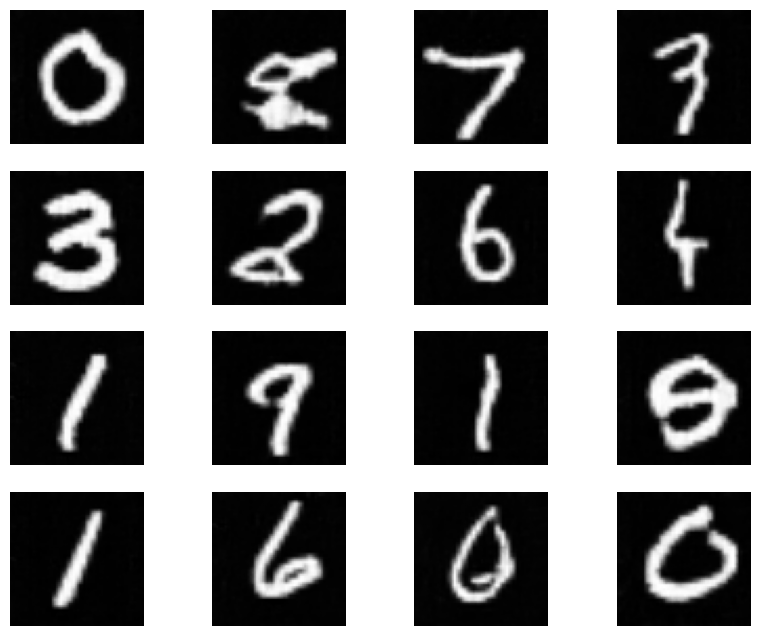

[Epoch 33/50] [Step 0/469] loss_D: 0.1181, loss_G: 4.2805
[Epoch 33/50] [Step 100/469] loss_D: 0.2221, loss_G: 2.8471
[Epoch 33/50] [Step 200/469] loss_D: 0.2440, loss_G: 2.8152
[Epoch 33/50] [Step 300/469] loss_D: 0.2959, loss_G: 2.6540
[Epoch 33/50] [Step 400/469] loss_D: 0.2678, loss_G: 2.7329
[Epoch 33/50] loss_D: 0.2716, loss_G: 2.7456
Generated images:


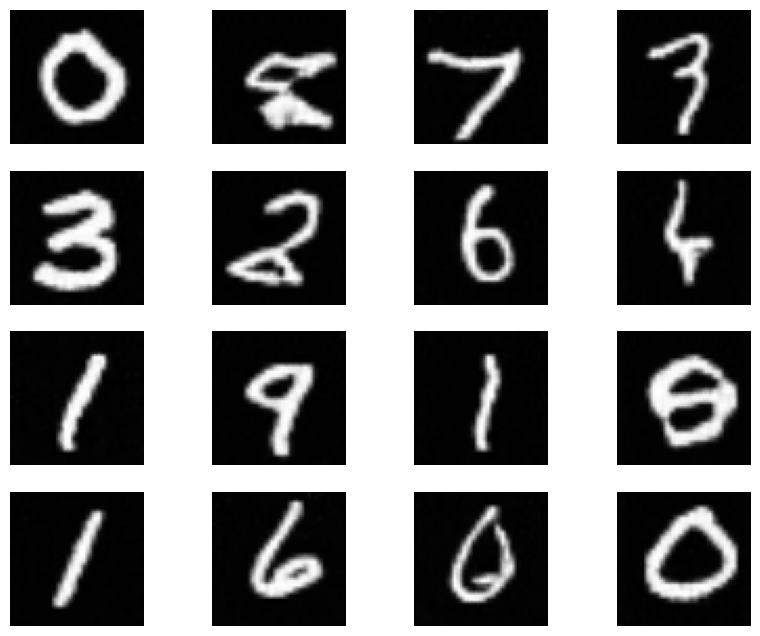

[Epoch 34/50] [Step 0/469] loss_D: 0.2770, loss_G: 1.8611
[Epoch 34/50] [Step 100/469] loss_D: 0.2861, loss_G: 2.5756
[Epoch 34/50] [Step 200/469] loss_D: 0.2540, loss_G: 2.8110
[Epoch 34/50] [Step 300/469] loss_D: 0.2652, loss_G: 2.7559
[Epoch 34/50] [Step 400/469] loss_D: 0.2242, loss_G: 2.9178
[Epoch 34/50] loss_D: 0.2533, loss_G: 2.8686
Generated images:


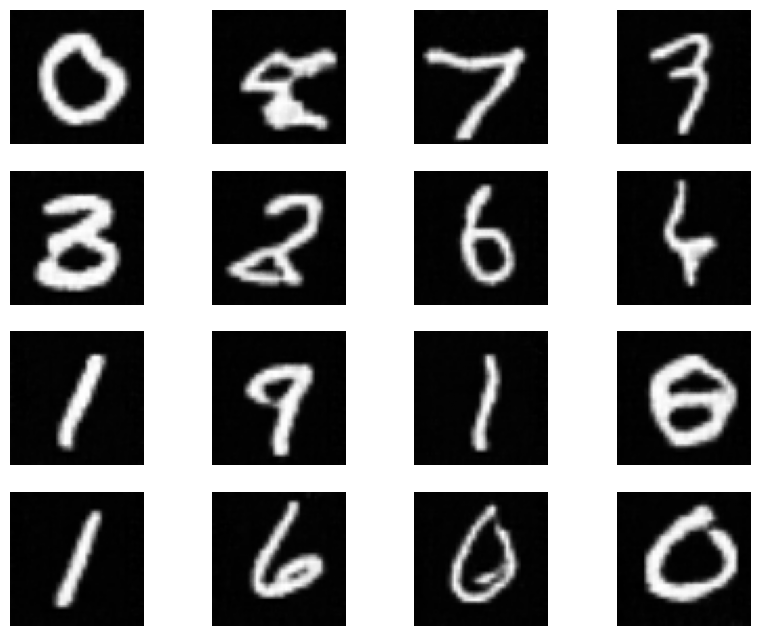

[Epoch 35/50] [Step 0/469] loss_D: 0.2112, loss_G: 1.5740
[Epoch 35/50] [Step 100/469] loss_D: 0.2378, loss_G: 2.8882
[Epoch 35/50] [Step 200/469] loss_D: 0.2575, loss_G: 2.8310
[Epoch 35/50] [Step 300/469] loss_D: 0.2957, loss_G: 2.6583
[Epoch 35/50] [Step 400/469] loss_D: 0.2867, loss_G: 2.7162
[Epoch 35/50] loss_D: 0.2810, loss_G: 2.7361
Generated images:


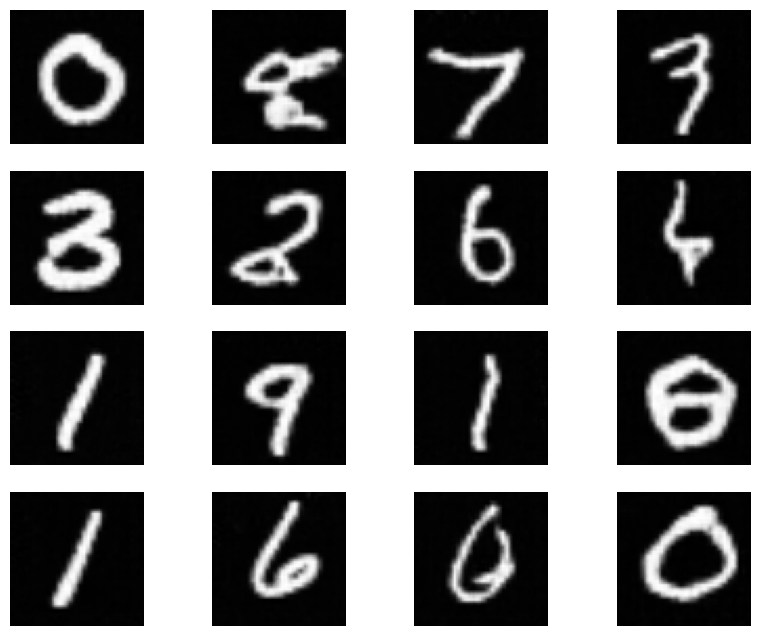

[Epoch 36/50] [Step 0/469] loss_D: 0.2238, loss_G: 1.9088
[Epoch 36/50] [Step 100/469] loss_D: 0.0789, loss_G: 3.5340
[Epoch 36/50] [Step 200/469] loss_D: 0.1471, loss_G: 3.4229
[Epoch 36/50] [Step 300/469] loss_D: 0.2055, loss_G: 3.1784
[Epoch 36/50] [Step 400/469] loss_D: 0.1811, loss_G: 3.2690
[Epoch 36/50] loss_D: 0.1603, loss_G: 3.3881
Generated images:


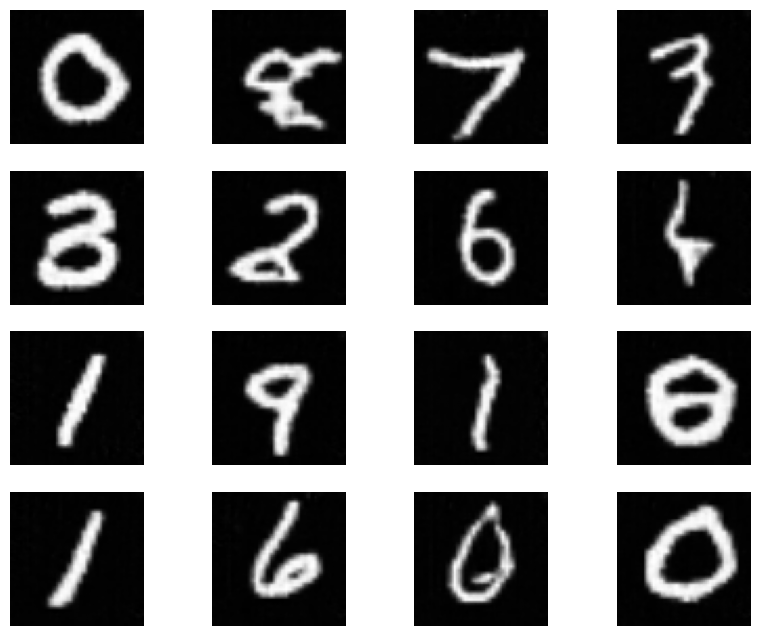

[Epoch 37/50] [Step 0/469] loss_D: 0.0316, loss_G: 3.9780
[Epoch 37/50] [Step 100/469] loss_D: 0.2971, loss_G: 3.1348
[Epoch 37/50] [Step 200/469] loss_D: 0.3081, loss_G: 2.8384
[Epoch 37/50] [Step 300/469] loss_D: 0.2965, loss_G: 2.9332
[Epoch 37/50] [Step 400/469] loss_D: 0.3136, loss_G: 2.7705
[Epoch 37/50] loss_D: 0.3030, loss_G: 2.7890
Generated images:


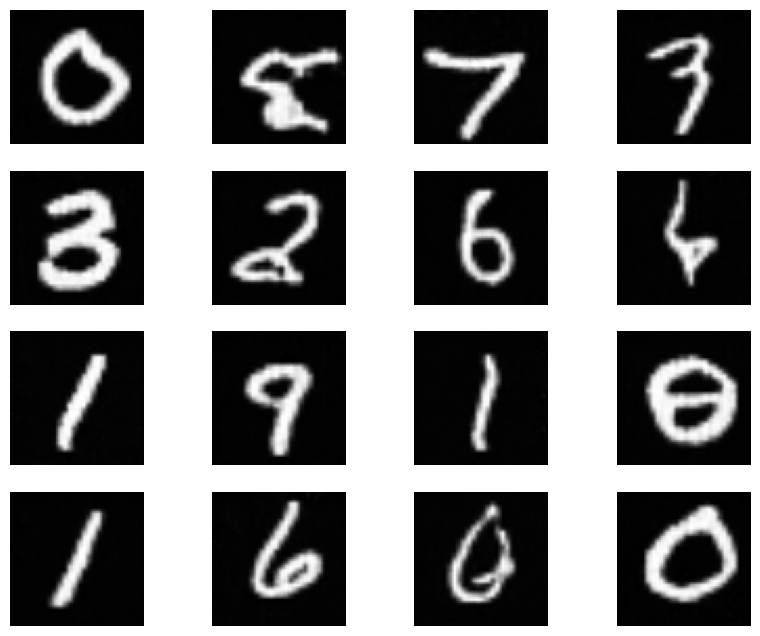

[Epoch 38/50] [Step 0/469] loss_D: 0.3123, loss_G: 3.1728
[Epoch 38/50] [Step 100/469] loss_D: 0.2225, loss_G: 2.8918
[Epoch 38/50] [Step 200/469] loss_D: 0.3016, loss_G: 2.7244
[Epoch 38/50] [Step 300/469] loss_D: 0.3222, loss_G: 2.5711
[Epoch 38/50] [Step 400/469] loss_D: 0.3098, loss_G: 2.6023
[Epoch 38/50] loss_D: 0.3072, loss_G: 2.6401
Generated images:


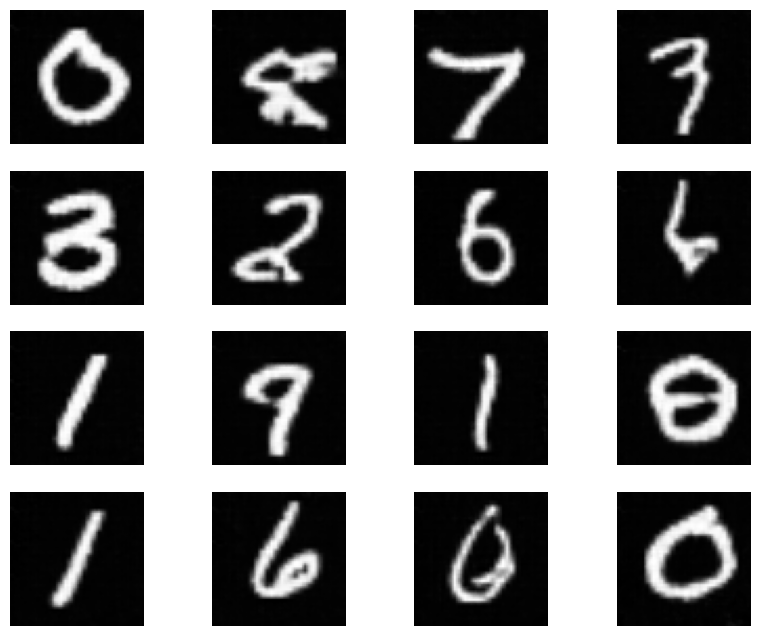

[Epoch 39/50] [Step 0/469] loss_D: 0.3431, loss_G: 2.5647
[Epoch 39/50] [Step 100/469] loss_D: 0.2127, loss_G: 2.9396
[Epoch 39/50] [Step 200/469] loss_D: 0.1982, loss_G: 3.2629
[Epoch 39/50] [Step 300/469] loss_D: 0.1745, loss_G: 3.2960
[Epoch 39/50] [Step 400/469] loss_D: 0.2218, loss_G: 3.0628
[Epoch 39/50] loss_D: 0.2154, loss_G: 3.0953
Generated images:


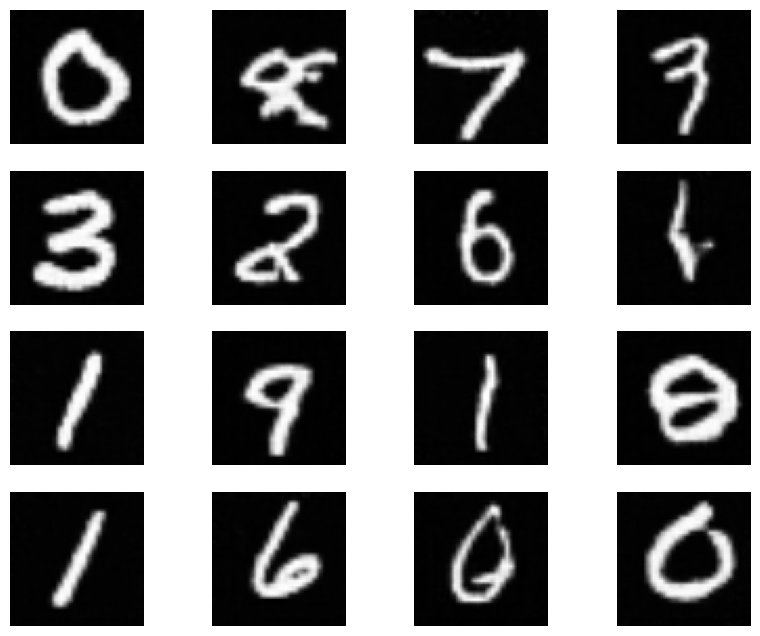

[Epoch 40/50] [Step 0/469] loss_D: 0.1939, loss_G: 1.0525
[Epoch 40/50] [Step 100/469] loss_D: 0.1037, loss_G: 3.6233
[Epoch 40/50] [Step 200/469] loss_D: 0.1553, loss_G: 3.5761
[Epoch 40/50] [Step 300/469] loss_D: 0.2088, loss_G: 3.2827
[Epoch 40/50] [Step 400/469] loss_D: 0.1928, loss_G: 3.3443
[Epoch 40/50] loss_D: 0.2457, loss_G: 3.0973
Generated images:


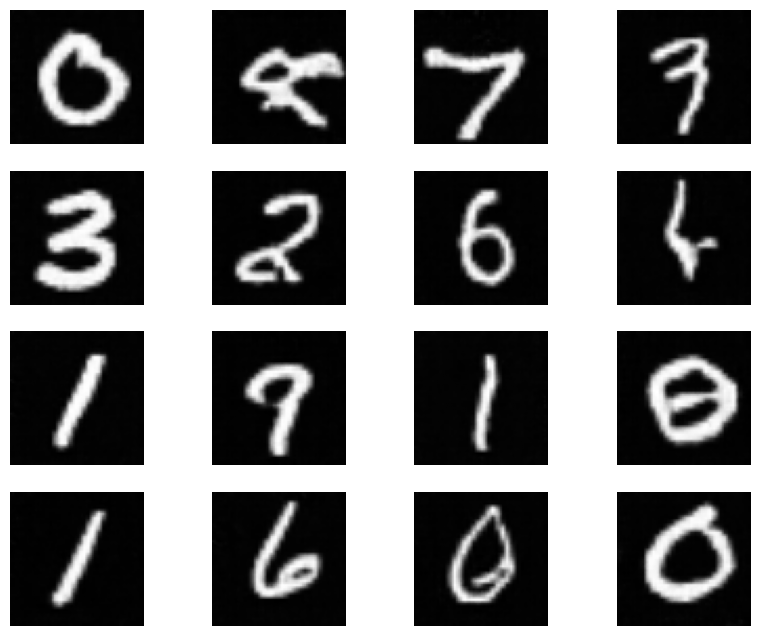

[Epoch 41/50] [Step 0/469] loss_D: 0.2629, loss_G: 2.4966
[Epoch 41/50] [Step 100/469] loss_D: 0.3624, loss_G: 2.4020
[Epoch 41/50] [Step 200/469] loss_D: 0.3498, loss_G: 2.4284
[Epoch 41/50] [Step 300/469] loss_D: 0.3151, loss_G: 2.5945
[Epoch 41/50] [Step 400/469] loss_D: 0.2846, loss_G: 2.7549
[Epoch 41/50] loss_D: 0.2715, loss_G: 2.8234
Generated images:


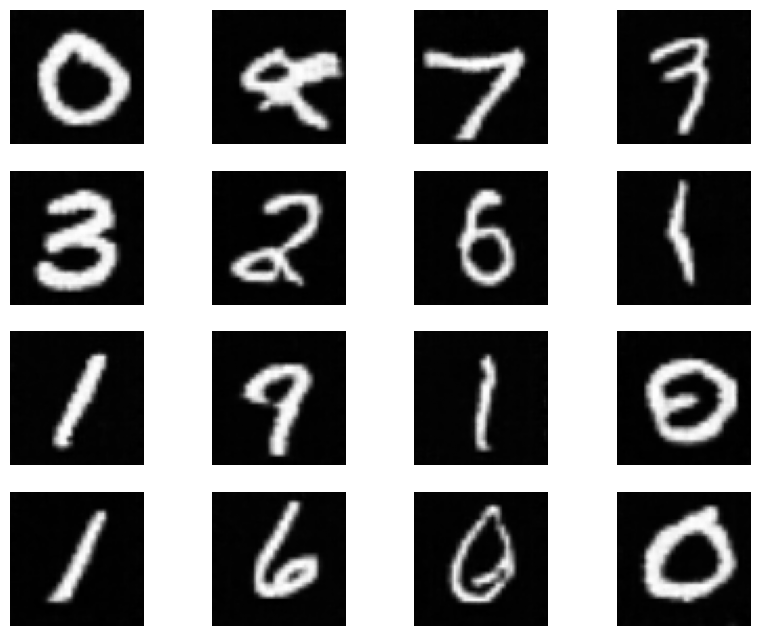

[Epoch 42/50] [Step 0/469] loss_D: 0.0805, loss_G: 4.3491
[Epoch 42/50] [Step 100/469] loss_D: 0.0355, loss_G: 4.1385
[Epoch 42/50] [Step 200/469] loss_D: 0.2585, loss_G: 3.2005
[Epoch 42/50] [Step 300/469] loss_D: 0.2852, loss_G: 2.9160
[Epoch 42/50] [Step 400/469] loss_D: 0.2910, loss_G: 2.8627
[Epoch 42/50] loss_D: 0.2935, loss_G: 2.8296
Generated images:


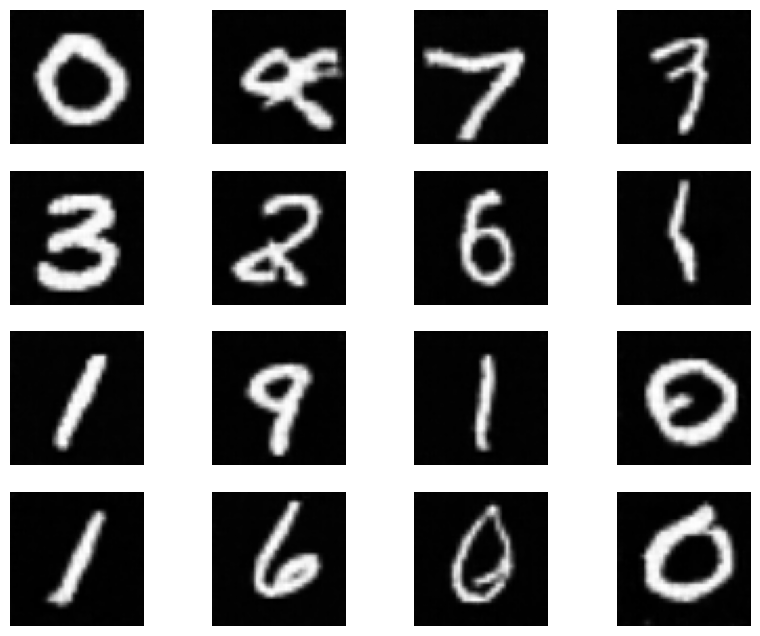

[Epoch 43/50] [Step 0/469] loss_D: 0.2860, loss_G: 6.2611
[Epoch 43/50] [Step 100/469] loss_D: 0.3663, loss_G: 2.4350
[Epoch 43/50] [Step 200/469] loss_D: 0.2929, loss_G: 2.7935
[Epoch 43/50] [Step 300/469] loss_D: 0.2528, loss_G: 2.8879
[Epoch 43/50] [Step 400/469] loss_D: 0.2605, loss_G: 2.8892
[Epoch 43/50] loss_D: 0.2285, loss_G: 3.0561
Generated images:


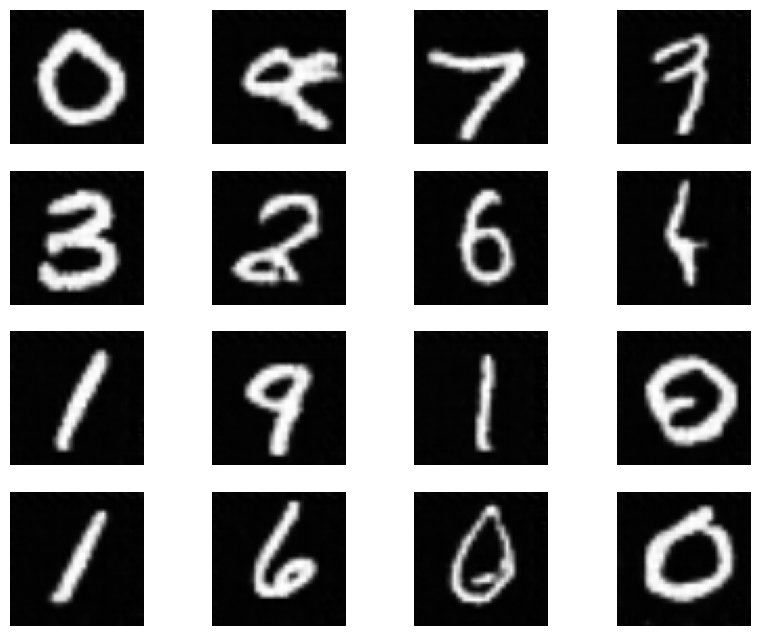

[Epoch 44/50] [Step 0/469] loss_D: 0.0284, loss_G: 4.2592
[Epoch 44/50] [Step 100/469] loss_D: 0.2123, loss_G: 3.5015
[Epoch 44/50] [Step 200/469] loss_D: 0.1254, loss_G: 3.8273
[Epoch 44/50] [Step 300/469] loss_D: 0.1871, loss_G: 3.5904
[Epoch 44/50] [Step 400/469] loss_D: 0.2073, loss_G: 3.3868
[Epoch 44/50] loss_D: 0.2126, loss_G: 3.3326
Generated images:


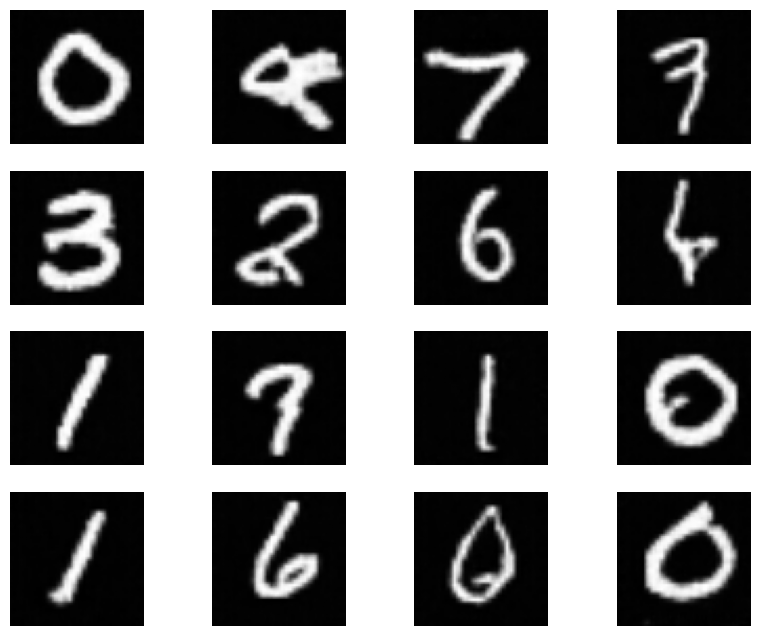

[Epoch 45/50] [Step 0/469] loss_D: 0.0563, loss_G: 3.4922
[Epoch 45/50] [Step 100/469] loss_D: 0.3376, loss_G: 2.5492
[Epoch 45/50] [Step 200/469] loss_D: 0.2350, loss_G: 3.2114
[Epoch 45/50] [Step 300/469] loss_D: 0.2391, loss_G: 3.0886
[Epoch 45/50] [Step 400/469] loss_D: 0.2138, loss_G: 3.1995
[Epoch 45/50] loss_D: 0.1864, loss_G: 3.3890
Generated images:


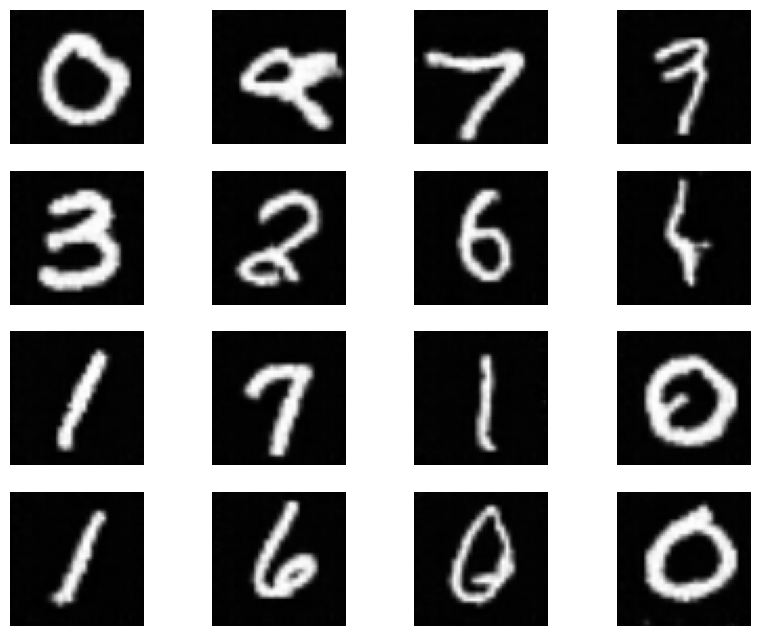

[Epoch 46/50] [Step 0/469] loss_D: 0.0315, loss_G: 5.2359
[Epoch 46/50] [Step 100/469] loss_D: 0.2721, loss_G: 3.1492
[Epoch 46/50] [Step 200/469] loss_D: 0.3001, loss_G: 2.9671
[Epoch 46/50] [Step 300/469] loss_D: 0.2552, loss_G: 3.1324
[Epoch 46/50] [Step 400/469] loss_D: 0.1993, loss_G: 3.4467
[Epoch 46/50] loss_D: 0.2193, loss_G: 3.3478
Generated images:


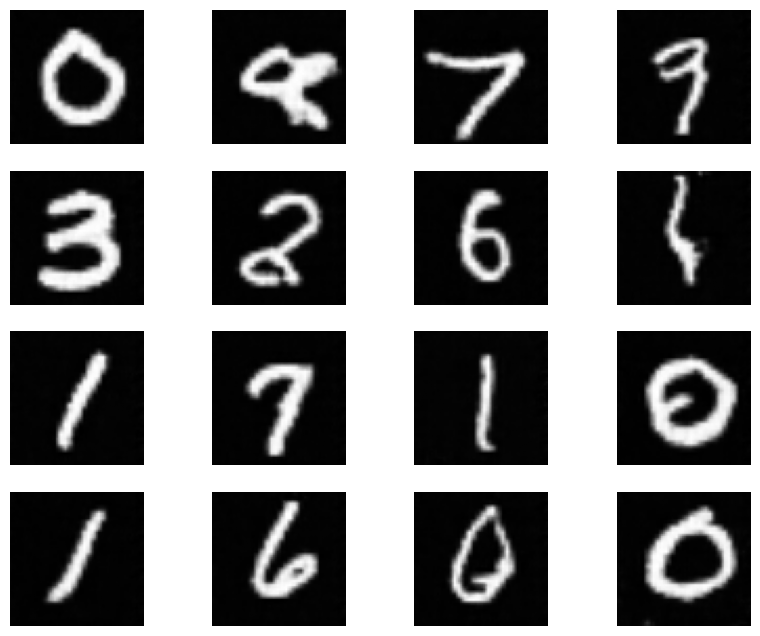

[Epoch 47/50] [Step 0/469] loss_D: 0.1025, loss_G: 3.5294
[Epoch 47/50] [Step 100/469] loss_D: 0.4030, loss_G: 2.3047
[Epoch 47/50] [Step 200/469] loss_D: 0.3998, loss_G: 2.3411
[Epoch 47/50] [Step 300/469] loss_D: 0.3525, loss_G: 2.6153
[Epoch 47/50] [Step 400/469] loss_D: 0.3020, loss_G: 2.7940
[Epoch 47/50] loss_D: 0.2627, loss_G: 3.0180
Generated images:


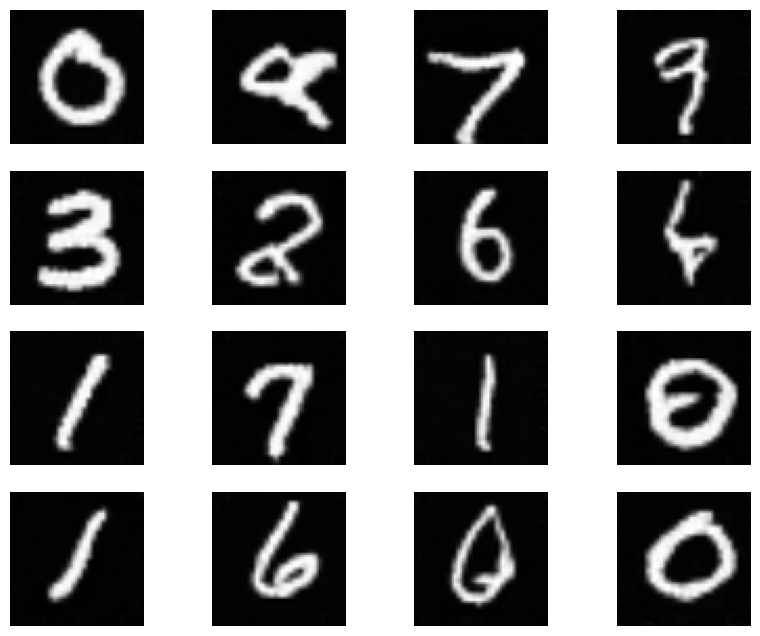

[Epoch 48/50] [Step 0/469] loss_D: 0.0684, loss_G: 5.7438
[Epoch 48/50] [Step 100/469] loss_D: 0.0228, loss_G: 4.6032
[Epoch 48/50] [Step 200/469] loss_D: 0.1889, loss_G: 3.6202
[Epoch 48/50] [Step 300/469] loss_D: 0.2150, loss_G: 3.3803
[Epoch 48/50] [Step 400/469] loss_D: 0.2274, loss_G: 3.2898
[Epoch 48/50] loss_D: 0.2174, loss_G: 3.3280
Generated images:


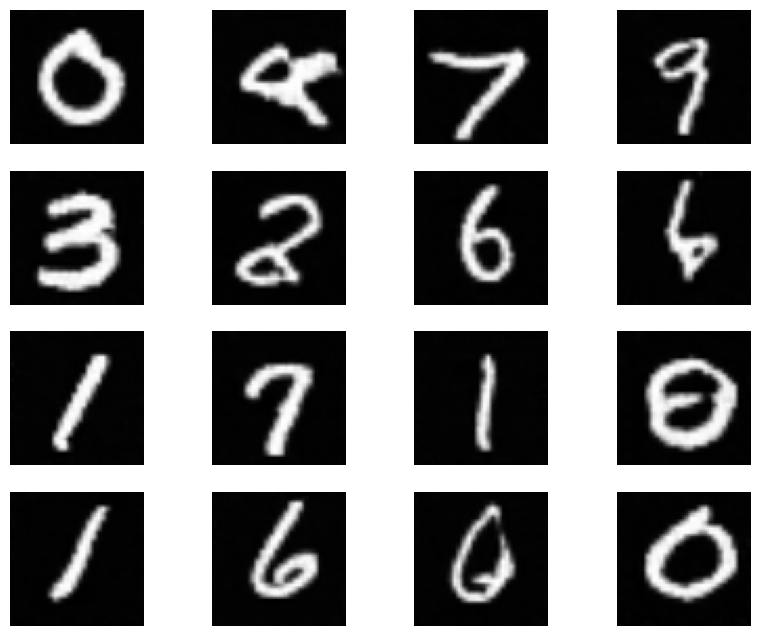

[Epoch 49/50] [Step 0/469] loss_D: 0.0205, loss_G: 4.3718
[Epoch 49/50] [Step 100/469] loss_D: 0.1791, loss_G: 3.7503
[Epoch 49/50] [Step 200/469] loss_D: 0.2306, loss_G: 3.2879
[Epoch 49/50] [Step 300/469] loss_D: 0.2019, loss_G: 3.3926
[Epoch 49/50] [Step 400/469] loss_D: 0.1584, loss_G: 3.6946
[Epoch 49/50] loss_D: 0.1381, loss_G: 3.8724
Generated images:


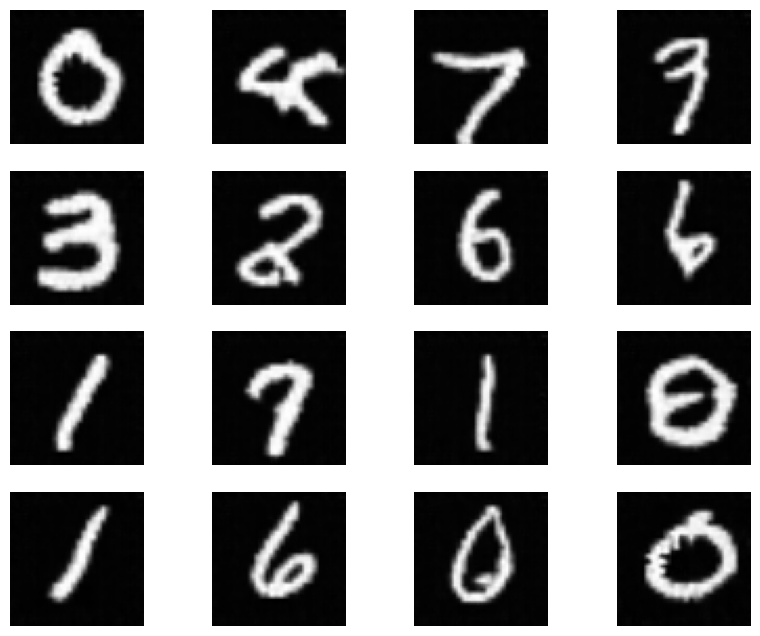

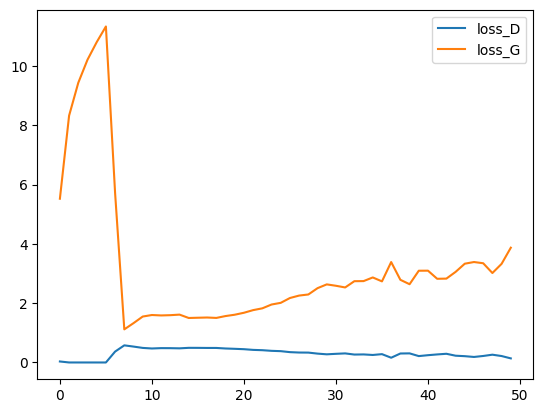

In [ ]:
lr_D = 0.0002
lr_G = 0.0002
num_epochs = 50
latent_dim = 100
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
discriminator = Discriminator(init_channels=64, img_channels=1).to(device)
fixed_noise = torch.normal(0., 1., size=(16, latent_dim, 1, 1))
generator = Generator(init_channels=1024, latent_dim=latent_dim, img_channels=1).to(device)
train_dcgan(D=discriminator, G=generator, lr_G=lr_G, lr_D=lr_D, latent_dim=latent_dim,
            dataloader=train_dataloader, num_epochs=num_epochs,
            device=device, fixed_noise=fixed_noise, visualize=True, print_every=100)

In [ ]:
from google.colab import files
import shutil

shutil.make_archive("visualizations", 'zip', "/content/visualizations")
files.download("visualizations.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>